In [1]:
import os
N_THREADS = '4'
os.environ['OMP_NUM_THREADS'] = N_THREADS
os.environ['OPENBLAS_NUM_THREADS'] = N_THREADS
os.environ['MKL_NUM_THREADS'] = N_THREADS
os.environ['VECLIB_MAXIMUM_THREADS'] = N_THREADS
os.environ['NUMEXPR_NUM_THREADS'] = N_THREADS


In [2]:
from pyprojroot import here
import sys

sys.path.insert(0, str(here()))

import pandas as pd
from pandas_datareader.wb import WorldBankReader

from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
from laos_gggi.plotting import prepare_gridspec_figure

import gEconpy as ge
import gEconpy.plotting as gp

import nutpie as ntp

In [3]:
indicators = {'NY.GDP.MKTP.KD': 'gdp', # Constant 2015 USD, millions
              'SL.UEM.TOTL.ZS': 'unemployment',
              'SP.POP.TOTL': 'population',
              "SL.TLF.CACT.ZS": "labor_participation",
              "FP.CPI.TOTL":'cpi',
              'FP.CPI.TOTL.ZG': 'cpi_inflation',
              'FR.INR.LEND': "lending_rate",
              'FR.INR.RINR': 'real_interest',
              "NE.GDI.FTOT.KD": 'capital_formation',  # Constant 2015 USD, millions
              "NE.CON.PRVT.KD": 'hh_consumption',  # Constant 2015 USD, millions
              "NE.CON.GOVT.KD": 'gov_consumption',  # Constant 2015 USD, millions
              "PA.NUS.FCRF": 'exchange_rate' # local to USD
             }

lao_wb_data_fname = 'laos_world_bank.csv'
data_path = Path(here()) / 'data' / lao_wb_data_fname
FORCE_RELOAD = False

if not data_path.exists() or FORCE_RELOAD:
    wb_data = WorldBankReader(symbols=list(indicators.keys()),
                              countries=['LAO'],
                              start='1970-01-01',
                              end='2025-01-01').read()
    wb_data.to_csv(data_path)

else:
    wb_data = pd.read_csv(data_path, index_col=[0, 1])
    
wb_data = (wb_data.rename(columns=indicators)
           .droplevel(axis=0, level=0)
           .reset_index()
           .assign(year = lambda x: pd.to_datetime(x.year, format='%Y'))
           .set_index('year')
           .assign(unemployment = lambda x: x.unemployment / 100,
                   labor_participation = lambda x: x.labor_participation / 100,
                   population = lambda x: x.population / 1e6,
                   lending_rate = lambda x: x.lending_rate / 100,
                   real_interest = lambda x: x.real_interest / 100,
                   gdp = lambda x: x.gdp / 1e6,
                   capital_formation = lambda x: x.capital_formation / 1e6,
                   hh_consumption = lambda x: x.hh_consumption / 1e6,
                   gov_consumption = lambda x: x.gov_consumption / 1e6
                   )
           .assign(working = lambda x: x.population * x.labor_participation * (1 - x.unemployment))
          )

In [4]:
# Penn table variables are in constant 2017 USD, millions 
pwt_df = pd.read_csv(here('data/penn_world_table_laopdr.csv'))

code_to_name = pwt_df[['Variable code', 'Variable name']].set_index('Variable code')['Variable name'].to_dict()
short_names = ['depreciation', 
               'engaged',
               'real_return_rate', 
               'P_capital_service', 
               'P_capital_stock',
               'population',
               'total_consumption',
               'domestic_absorption',
               'gdp',
               'capital_services',
               'capital_stock',
               'tfp',
               'xr']

code_to_short = dict(zip(code_to_name.keys(), short_names))

drop_cols = ['ISO code', 'Country', 'Variable name']
pwt_df = (pwt_df
              .drop(columns=drop_cols)
              .set_index('Variable code')
              .T
              .assign(year = lambda x: pd.to_datetime(x.index, format='%Y'))
              .reset_index(drop=True)
              .set_index('year')
              .rename(columns=code_to_short)
         )

code_to_name

{'delta': 'Average depreciation rate of the capital stock',
 'emp': 'Number of persons engaged (in millions)',
 'irr': 'Real internal rate of return',
 'pl_k': 'Price level of the capital services, price level of USA=1',
 'pl_n': 'Price level of the capital stock, price level of USA in 2017=1',
 'pop': 'Population (in millions)',
 'rconna': 'Real consumption at constant 2017 national prices (in mil. 2017US$)',
 'rdana': 'Real domestic absorption at constant 2017 national prices (in mil. 2017US$)',
 'rgdpna': 'Real GDP at constant 2017 national prices (in mil. 2017US$)',
 'rkna': 'Capital services at constant 2017 national prices (2017=1)',
 'rnna': 'Capital stock at constant 2017 national prices (in mil. 2017US$)',
 'rtfpna': 'TFP at constant national prices (2017=1)',
 'xr': 'Exchange rate, national currency/USD (market+estimated)'}

In [5]:
code_to_name2 = pd.read_excel(here('data/pwt100-na-data.xlsx'), sheet_name='Legend', index_col=0).iloc[:, 0].to_dict()

In [6]:
adj_factor = pwt_df.gdp / wb_data.gdp

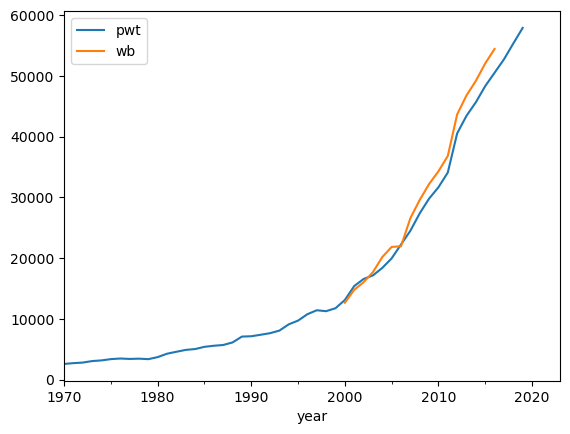

In [7]:
fig, ax = plt.subplots()
pwt_df.domestic_absorption.plot(ax=ax, label='pwt')
(wb_data[['hh_consumption', 'gov_consumption', 'capital_formation']].sum(axis=1) * adj_factor).replace({0.0:np.nan}).plot(ax=ax, label='wb')
ax.legend()

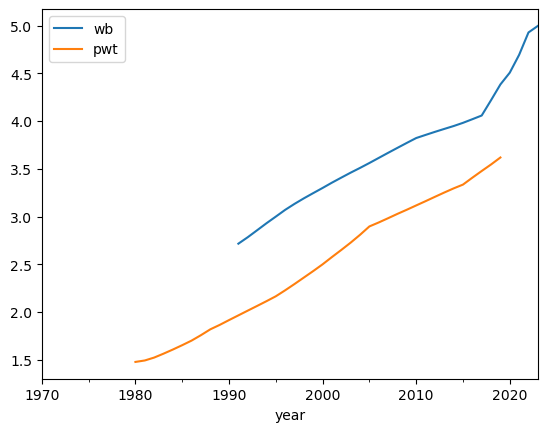

In [8]:
fig, ax = plt.subplots()
wb_data.working.plot(ax=ax, label='wb')
pwt_df.engaged.plot(ax=ax, label='pwt')
ax.legend()

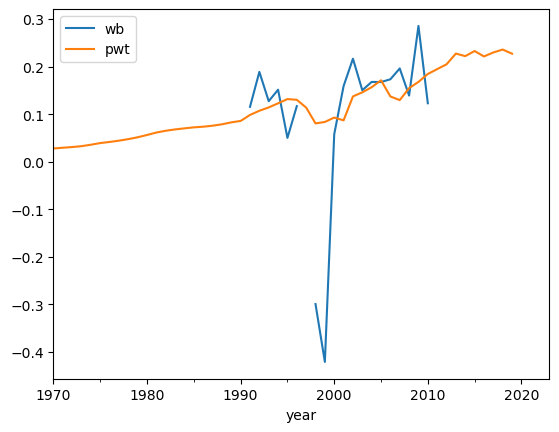

In [9]:
fig, ax = plt.subplots()
wb_data.real_interest.plot(ax=ax, label='wb')
pwt_df.P_capital_stock.plot(ax=ax, label='pwt')
ax.legend()

In [10]:
df = (pwt_df[['engaged', 'P_capital_stock', 'domestic_absorption', 'capital_stock', 'tfp']]
    .join(wb_data[['hh_consumption', 'gov_consumption', 'capital_formation']] * adj_factor.values[:, None])
    .join(wb_data[['cpi_inflation', 'lending_rate']])
    
    # Assume 8-hour working day, 5 days/week, 12 weeks per quarter 
    .assign(N = lambda x: x.eval('engaged * 8 * 5 * 12'))
    .drop(columns=['engaged'])
    .rename(columns={'P_capital_stock': 'r',
                     'domestic_absorption': 'Y',
                     'capital_stock': 'K',
                     'tfp': 'A',
                     'hh_consumption': 'C',
                     'gov_consumption': 'G',
                     'capital_formation': 'I',
                     'cpi_inflation': 'pi',
                     'lending_rate': 'i'}))

df.index.freq = df.index.inferred_freq

In [11]:
df

,r,Y,K,A,C,G,I,pi,i,N
year,,,,,,,,,,
1970-01-01,0.027775,2591.476318,5938.581055,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1971-01-01,0.029349,2720.441895,6080.508789,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1972-01-01,0.030765,2814.152100,6216.376465,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1973-01-01,0.032640,3061.381592,6372.757324,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1974-01-01,0.035673,3172.131592,6524.074219,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1975-01-01,0.039161,3383.105225,6685.784180,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1976-01-01,0.041530,3481.070557,6839.929688,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1977-01-01,0.044172,3412.223389,6968.051270,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1978-01-01,0.047439,3457.902832,7098.401367,NaN,NaN,NaN,NaN,NaN,NaN,NaN


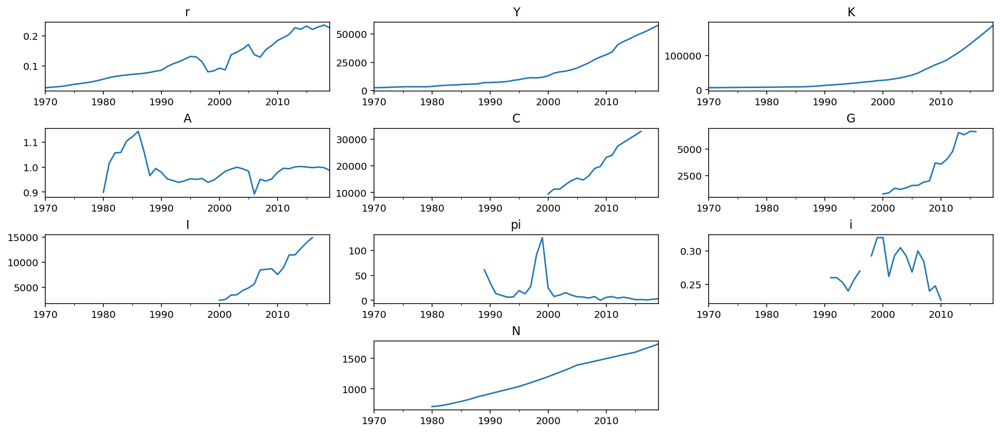

In [12]:
fig = plt.figure(figsize=(14, 6), dpi=144, layout='constrained')
gs, locs = prepare_gridspec_figure(n_cols = 3, n_plots=df.shape[1], figure=fig)
for loc, variable in zip(locs, df):
    axis = fig.add_subplot(gs[loc])
    df[variable].plot(ax=axis)
    axis.set(title=variable, xlabel='')
plt.show()

In [13]:
from pymc_extras.statespace import BayesianETS
from pymc_extras.inference.find_map import find_MAP
from pymc_extras.inference.laplace import fit_laplace

import pymc_extras as pmx
import preliz as pz
import pymc as pm
import arviz as az

In [14]:
to_detrend = ['Y', 'K', 'C', 'G', 'I', 'N', 'r']
flow_variables = ['Y', 'C', 'G', 'I', 'N']

df_detrend = df.copy()[to_detrend].resample('QS-OCT').last()

# Rescale flow variables to reflect switch to quarterly
df_detrend[flow_variables] = df_detrend[flow_variables] / 4

In [15]:
to_detrend = ['Y', 'K', 'C', 'G', 'I', 'N', 'r']
flow_variables = ['Y', 'C', 'G', 'I', 'N']

df_detrend = df.copy()[to_detrend].resample('QS-OCT').last()

# Rescale flow variables to reflect switch to quarterly
df_detrend[flow_variables] = df_detrend[flow_variables] / 4

trend_mod = BayesianETS(order=('A', 'Ad', 'N'), 
                  endog_names=to_detrend,
                  trend=True,
                  damped_trend=True,
                  measurement_error=True,
                  stationary_initialization=True,
                  initialization_dampening=0.95)

prior_dict = {
    'alpha': pz.maxent(pz.Beta(), lower=0.8, upper=0.99, plot=False),
    'beta': pz.maxent(pz.Beta(), lower=0.8, upper=0.99, plot=False),
    'phi': pz.maxent(pz.Beta(), lower=0.8, upper=0.99, mass=0.99, plot=False),
    'sigma_state': pz.maxent(pz.Gamma(), lower=0.01, upper=10, plot=False),
    'sigma_obs': pz.maxent(pz.Gamma(), lower=0.5, upper = 3, mass=0.99, plot=False)
}

with pm.Model(coords=trend_mod.coords) as m:
    initial_level = pm.Normal('initial_level', 
                              mu=df_detrend.apply(np.log).mean().values, 
                              sigma=3,
                             dims=['observed_state'])
    initial_trend = pm.Normal('initial_trend', 
                              mu=df_detrend.dropna(how='all').apply(np.log).diff().mean().values, 
                              sigma=0.1,
                              dims=['observed_state'])
    
    for var, dist in prior_dict.items():
        dist.to_pymc(name=var, dims=['observed_state'])

    trend_mod.build_statespace_graph(df_detrend.apply(np.log), mode='JAX')

    # Don't need a precise full posterior here; just just laplace
    trend_idata = pmx.fit(method='laplace',
                    optimize_method='trust-ncg',
                    use_grad=True,
                    use_hess=False,
                    use_hessp=True,
                    gradient_backend='jax',
                    chains=4,
                    draws=1000,
                    compile_kwargs={'mode':'JAX'},
                    fit_in_unconstrained_space=True,
                    on_bad_cov='error',
                    optimizer_kwargs=dict(gtol=1e-12,
                                          max_trust_radius=1,
                                          initial_trust_radius=0.1)
                   )
    

                      Model Requirements                       
                                                               
  Variable        Shape   Constraints              Dimensions  
 ───────────────────────────────────────────────────────────── 
  initial_level   (7,)                    ('observed_state',)  
  initial_trend   (7,)                    ('observed_state',)  
  alpha           (7,)    0 < alpha < 1   ('observed_state',)  
  beta            (7,)    0 < beta < 1    ('observed_state',)  
  phi             (7,)    0 < phi < 1     ('observed_state',)  
  sigma_state     (7,)    Positive        ('observed_state',)  
  sigma_obs       (7,)    Positive        ('observed_state',)  
                                                               
These parameters should be assigned priors inside a PyMC model 
    block before calling the build_statespace_graph method.    

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pymc_extras/statespace/utils/data_tools.py:159: ImputationWarning: Provided data contains missing values and will be automatically imputed as hidden states during Kalman filtering.
  warnings.warn(impute_message, ImputationWarning)


Output()

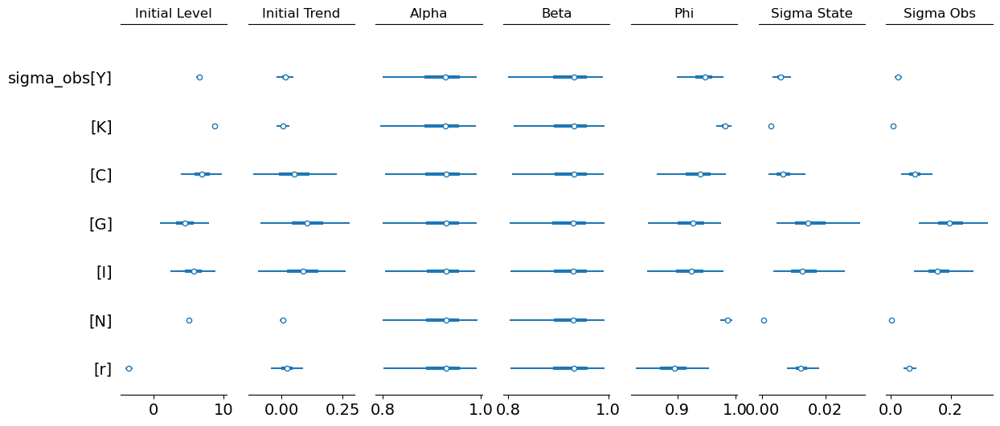

In [16]:
fig, ax = plt.subplots(1, len(m.free_RVs), figsize=(14, 6), sharey=True)
for var, axis in zip(m.free_RVs, fig.axes):
    az.plot_forest(trend_idata, var_names=[var.name], ax=axis, combined=True)
    axis.set_title(var.name.replace('_', ' ').title())

In [17]:
post_cond_trend = trend_mod.sample_conditional_posterior(trend_idata)

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pymc_extras/statespace/utils/data_tools.py:159: ImputationWarning: Provided data contains missing values and will be automatically imputed as hidden states during Kalman filtering.
  warnings.warn(impute_message, ImputationWarning)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pytensor/link/jax/linker.py:27: UserWarning: The RandomType SharedVariables [RNG(<Generator(PCG64) at 0x34AD04040>), RNG(<Generator(PCG64) at 0x34AD04AC0>), RNG(<Generator(PCG64) at 0x34AD05E00>), RNG(<Generator(PCG64) at 0x34AD049E0>), RNG(<Generator(PCG64) at 0x34AD04F20>), RNG(<Generator(PCG64) at 0x34ACEFA00>)] will not be used in the compiled JAX graph. Instead a copy will be used.
  warnings.warn(
Sampling: [filtered_posterior, filtered_posterior_observed, predicted_posterior, predicted_posterior_observed, smoothed_posterior, smoothed_posterior_observed]


Output()

In [18]:
import xarray as xr

xr_df = df_detrend.unstack().rename_axis(['observed_state', 'time'], axis=0).to_xarray()
res = np.log(xr_df) - post_cond_trend.smoothed_posterior_observed
res = res.dropna(how='all', dim='time')
hdi = az.hdi(res).x

hdi_range = (hdi.mean(dim='time')
                 .to_dataframe(())
                 .unstack('hdi')
                 .droplevel(axis=1, level=0)
                 .eval('higher - lower'))

# Use these as observation errors in the DSGE 
hdi_range.to_dict()

{'Y': 0.12094970865624485,
 'K': 0.03622808667631905,
 'C': 0.3938217380656177,
 'G': 0.941330518219114,
 'I': 0.7620601991907776,
 'N': 0.009754010099168698,
 'r': 0.29502351668813465}

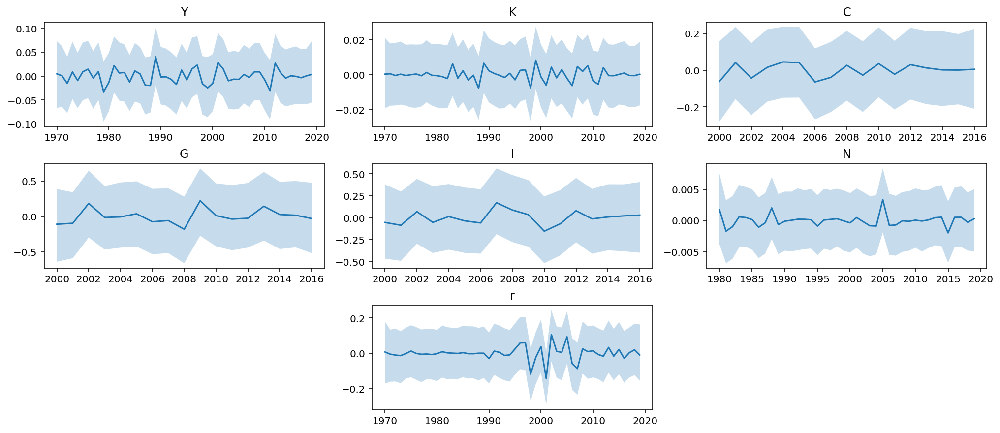

In [19]:
fig = plt.figure(figsize=(14, 6), dpi=144, layout='constrained')
gs, locs = prepare_gridspec_figure(n_cols = 3, n_plots=len(to_detrend), figure=fig)
for loc, variable in zip(locs, to_detrend):
    axis = fig.add_subplot(gs[loc])
    
    mu = res.sel(observed_state=variable).mean(dim=['chain', 'draw']).values
    
    axis.plot(df.index, mu)
    axis.fill_between(df.index, *hdi.sel(observed_state=variable).values.T, alpha=0.25)
    
    axis.set(title=variable, xlabel='')
plt.show()

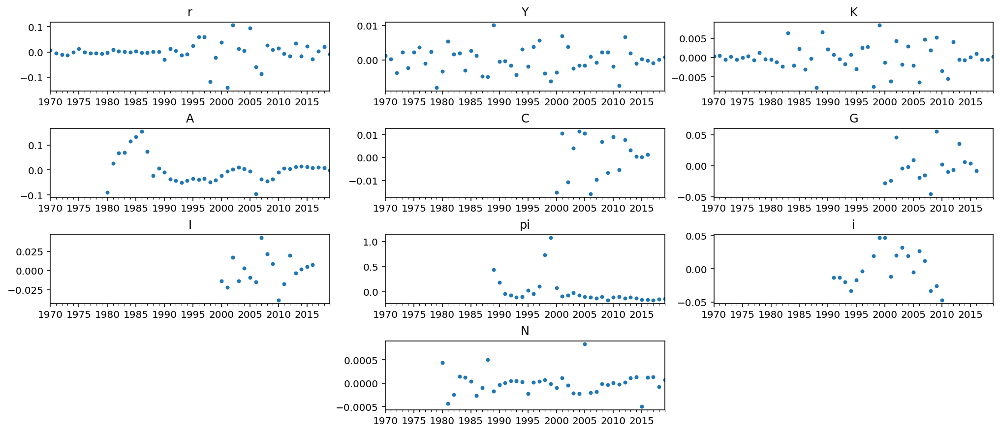

In [20]:
df_final = df.copy()
df_final[to_detrend] = res.mean(dim=['chain', 'draw']).to_dataframe()['x'].unstack('observed_state')[to_detrend]

df_final = df_final.resample('QS-OCT').last()

# Rescale flow variables to reflect switch to quarterly
flow_variables = ['Y', 'C', 'G', 'I', 'N']
df_final[flow_variables] = df_final[flow_variables] / 4

# Convert inflation to percentage
df_final['pi'] = df_final['pi'] / 100 

# Center stock variables
stock_variables = ['K', 'A', 'pi', 'i']
df_final[stock_variables] = df_final[stock_variables] - df_final[stock_variables].mean() 

fig = plt.figure(figsize=(14, 6), dpi=144, layout='constrained')
gs, locs = prepare_gridspec_figure(n_cols = 3, n_plots=df.shape[1], figure=fig)
for loc, variable in zip(locs, df):
    axis = fig.add_subplot(gs[loc])
    df_final[variable].plot(ax=axis, marker='o', markersize=3)
    axis.set(title=variable, xlabel='')
plt.show()

In [21]:
dsge_mod = ge.statespace_from_gcn('nk_complete_taxes.gcn',
                                  not_loglin_variables=['i', 'pi', 'pi_obj', 'tau_C', 'tau_K', 'tau_L'])

Model Building Complete.
Found:
	34 equations
	34 variables
		The following variables were eliminated at user request:
			D_t, K_d_t, N_i_t, TC_t, T_t, U_t, Y_j_t
		The following "variables" were defined as constants and have been substituted away:
			B_t
	12 stochastic shocks
		 0 / 12 has a defined prior. 
	35 parameters
		 27 / 35 parameters has a defined prior. 
	0 parameters to calibrate.
Model appears well defined and ready to proceed to solving.

Statespace model construction complete, but call the .configure method to finalize.


In [22]:
error_vars = ['N', 'K', 'A']
dsge_mod.configure(observed_states=df_final.columns,
                   measurement_error=error_vars,
                   constant_params=['pi_bar', 
                                    'phi_tau_C', 'phi_tau_K', 'phi_tau_L', 
                                    'psi',
                                    'tau_C', 'tau_K', 'tau_L'],
                   full_shock_covaraince=True,
                   solver='scan_cycle_reduction',
                   mode='JAX',
                   max_iter=20,
                   use_adjoint_gradients=True)

                              Model Requirements                              
                                                                              
  Variable        Shape      Constraints                          Dimensions  
 ──────────────────────────────────────────────────────────────────────────── 
  alpha           ()                                                    None  
  beta            ()                                                    None  
  chi             ()                                                    None  
  delta           ()                                                    None  
  epsilon_p       ()                                                    None  
  epsilon_w       ()                                                    None  
  gamma_I         ()                                                    None  
  phi_H           ()                                                    None  
  phi_Y           ()                                                    None  
  phi_p           ()                                                    None  
  phi_pi          ()                                                    None  
  phi_w           ()                                                    None  
  psi_z           ()                                                    None  
  rho_A           ()                                                    None  
  rho_G           ()                                                    None  
  rho_I           ()                                                    None  
  rho_beta        ()                                                    None  
  rho_i           ()                                                    None  
  rho_markup      ()                                                    None  
  rho_markup_w    ()                                                    None  
  rho_pi_dot      ()                                                    None  
  rho_tau_C       ()                                                    None  
  rho_tau_K       ()                                                    None  
  rho_tau_L       ()                                                    None  
  rho_theta       ()                                                    None  
  sigma           ()         Positive                                   None  
  theta           ()                                                    None  
  state_cov       (12, 12)   Positive Semi-Definite   ('shock', 'shock_aux')  
  error_sigma_N   ()                                                    None  
  error_sigma_K   ()                                                    None  
  error_sigma_A   ()                                                    None  
                                                                              
 These parameters should be assigned priors inside a PyMC model block before  
                  calling the build_statespace_graph method.                  

In [23]:
df_final[error_vars].std()

N    0.000234
K    0.003370
A    0.053116
dtype: float64

In [24]:
def make_error_prior(name, trend_error):
#     if name in trend_error:
#         error = trend_error[name]
    return pz.maxent(pz.Gamma(), lower=0, upper=df_final[name].std(), plot=False)
#     return pz.maxent(pz.Gamma(), lower=0.1, upper=0.5, plot=False)
    
error_priors = {
    f'error_sigma_{var}' : make_error_prior(var, hdi_range.to_dict())
    for var in error_vars
}
sigma_priors = {
    f'sigma_{var}': pz.maxent(pz.Exponential(), lower=0.001, upper=0.1, plot=False)
    for var in dsge_mod.shock_names
}

In [25]:
n_shocks = dsge_mod.k_posdef

A_params = pz.maxent(pz.Gamma(), lower=0.1, upper=0.5, plot=False).params_dict
other_params = pz.maxent(pz.Gamma(), lower=0.1, upper=0.5, plot=False).params_dict

std_priors = [pz.Gamma(**A_params)] + [pz.Gamma(**other_params)] * (n_shocks - 1)

sd_dist = pm.Gamma.dist(alpha=[A_params['alpha']] + [other_params['alpha']] * (n_shocks - 1),
                        beta=[A_params['beta']] + [other_params['beta']] * (n_shocks - 1))

In [26]:
with pm.Model(coords=dsge_mod.coords) as pm_mod:
    dsge_mod.to_pymc()
#     for name, prior in (error_priors | sigma_priors).items():
    for name, prior in error_priors.items():
        prior.to_pymc(name=name)
    chol, *_ = pm.LKJCholeskyCov('state_chol', 
                                 n=dsge_mod.k_posdef, 
                                 eta=15, 
                                 sd_dist=sd_dist)
    cov = pm.Deterministic('state_cov', chol @ chol.T, dims=['shock', 'shock_aux'])

    dsge_mod.build_statespace_graph(df_final,
                                    add_norm_check=True,
                                    add_solver_success_check=True,
                                    add_steady_state_penalty=True)

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pymc_extras/statespace/utils/data_tools.py:159: ImputationWarning: Provided data contains missing values and will be automatically imputed as hidden states during Kalman filtering.
  warnings.warn(impute_message, ImputationWarning)


In [27]:
# ntp_mod = ntp.compile_pymc_model(pm_mod, 
#                                  freeze_model=True,
#                                  backend='jax', 
#                                  gradient_backend='jax',
#                                  default_initialization_strategy='prior',
# #                                  jitter_rvs=,
# #                                  inital_points=None)
#                                  initial_points={k: v for k, v in dsge_mod.param_dict.items() if k in pm_mod})

In [28]:
# idata = ntp.sample(ntp_mod.with_transform_adapt(),
#                    tune=1000, 
#                    draws=1000,
#                    chains=4,
#                    target_accept=0.9,
#                    transform_adapt=True)
# az.to_netcdf(idata, 'laos_dsge_results_9.netcdf')
idata = az.from_netcdf('laos_dsge_results_9.netcdf')

<Axes: >

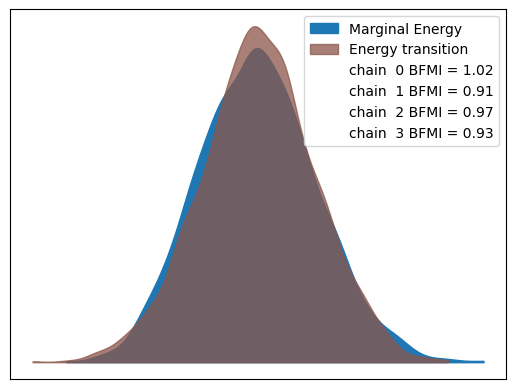

In [29]:
az.plot_energy(idata)

In [30]:
deep_params =['alpha', 'beta', 'delta', 'sigma', 'theta', 'chi', 'gamma_I', 'epsilon_p', 'epsilon_w', 'phi_H', 'phi_p', 'phi_w', 'psi_z', 'phi_pi', 'phi_Y']
rho_params = [rv.name for rv in pm_mod.free_RVs if rv.name.startswith('rho')]
all_params = [rv.name for rv in pm_mod.free_RVs if 'error' not in rv.name and 'state_chol' not in rv.name]
error_params = [rv.name for rv in pm_mod.free_RVs if rv.name.startswith('error')]
sigma_params = [rv.name for rv in pm_mod.free_RVs if rv.name in sigma_priors]


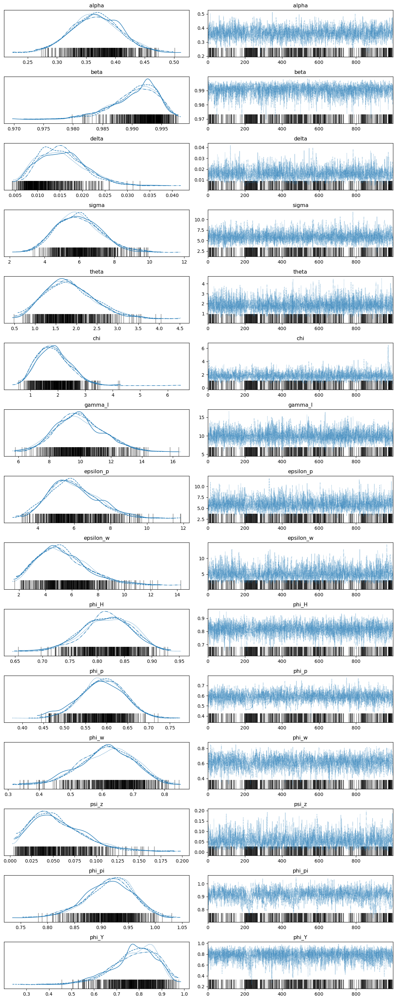

In [31]:
az.plot_trace(idata, var_names=deep_params);
plt.tight_layout()

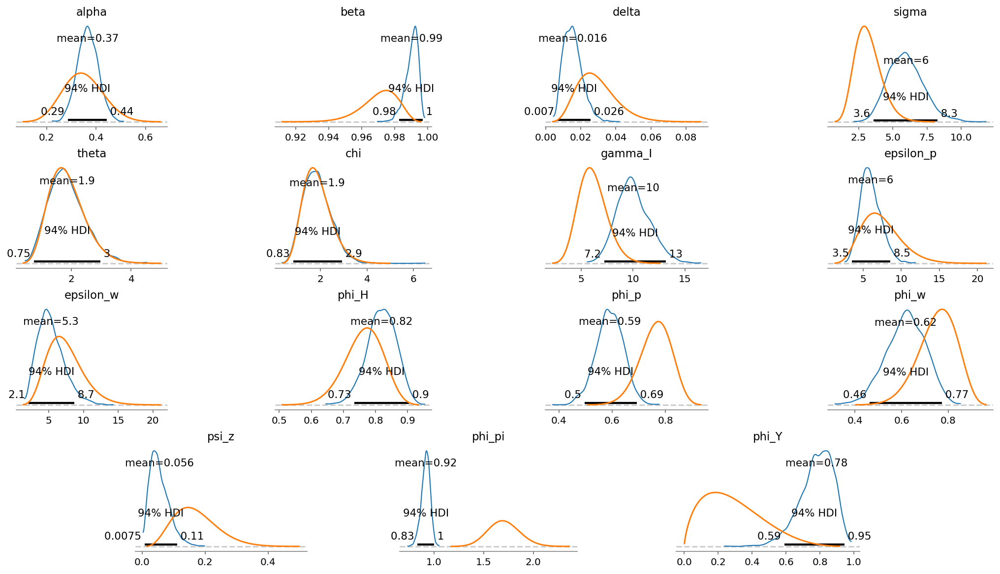

In [32]:
all_priors = dsge_mod.param_priors | dsge_mod.shock_priors

gp.plot_posterior_with_prior(idata, 
                             deep_params,
                             all_priors,
                             n_cols=4,
                             fig_kwargs={'dpi':144, 'layout':'constrained', 'figsize':(14,8)});

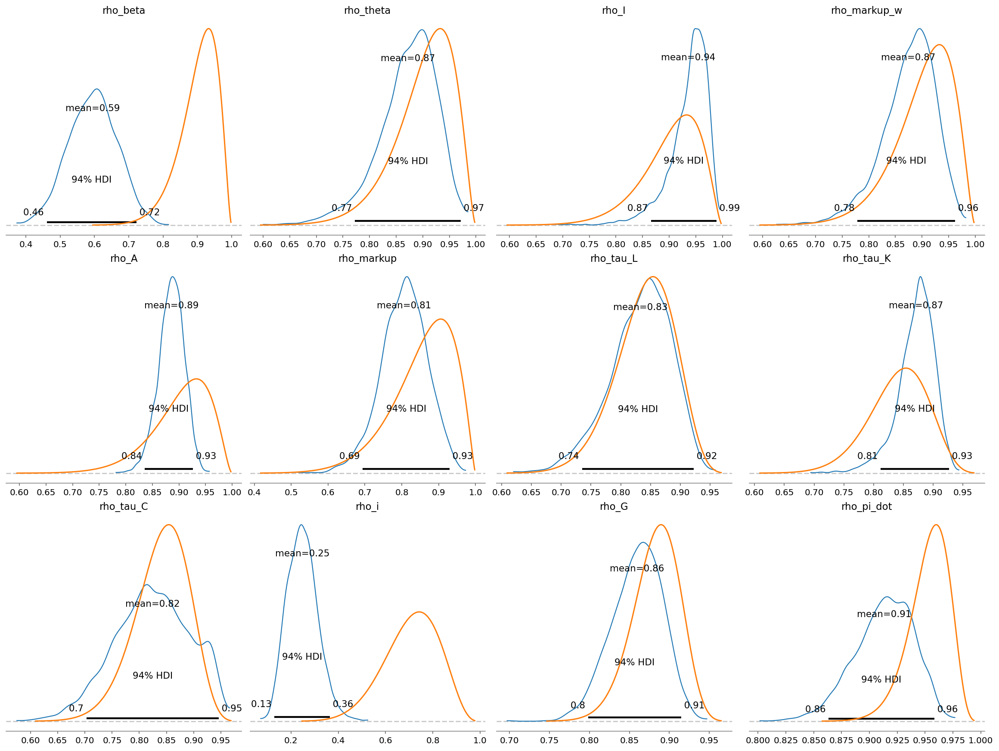

In [33]:
gp.plot_posterior_with_prior(idata, 
                          rho_params,
                          all_priors,
                          n_cols=4,
                          fig_kwargs={'dpi':144, 'layout':'constrained', 'figsize':(16, 12)});

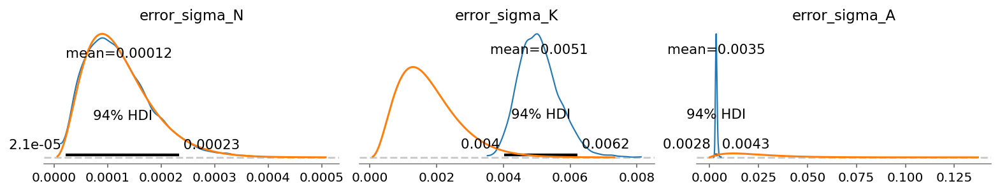

In [34]:
gp.plot_posterior_with_prior(idata, 
                          error_params,
                          all_priors | error_priors,
                          n_cols=4,
                          fig_kwargs={'dpi':144, 'layout':'constrained', 'figsize':(14,2)});

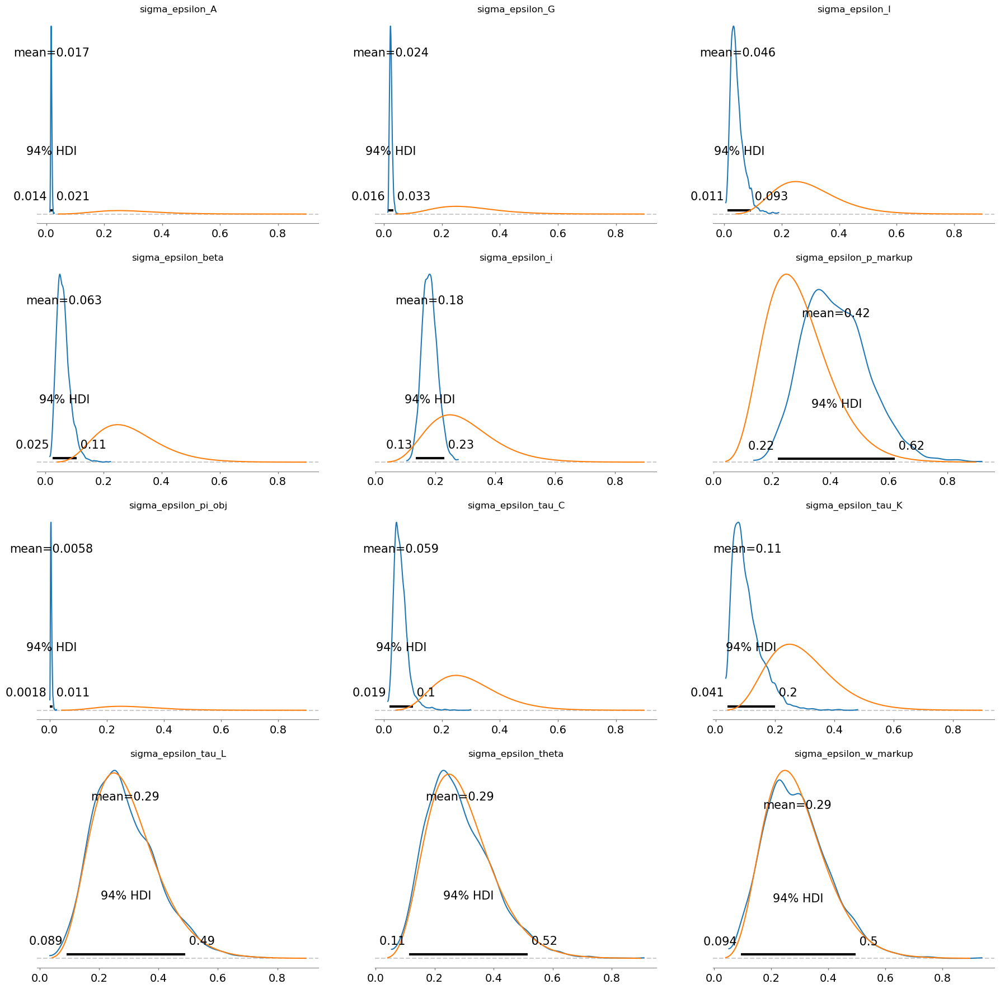

In [35]:
axes = az.plot_posterior(idata, var_names=['state_chol_stds'], filter_vars='like');
for d, axis, shock in zip(std_priors, axes.ravel(), dsge_mod.shocks):
    d.plot_pdf(ax=axis, color='tab:orange', legend=False)
    axis.set_title(f'sigma_{shock.base_name}')

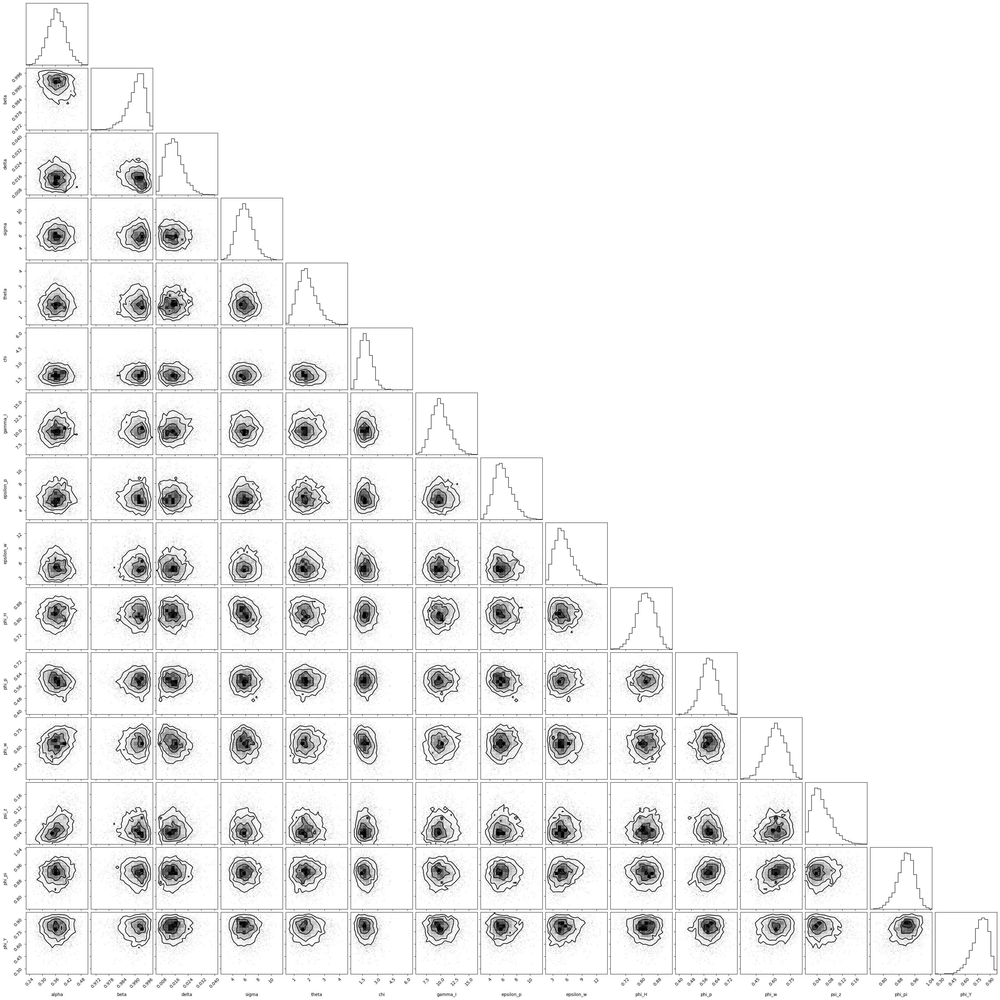

In [38]:
from corner import corner

corner(idata, 
       var_names=deep_params, 
       divergences=False, 
       divergences_kwargs={'markersize':4, 'color':'tab:red'});

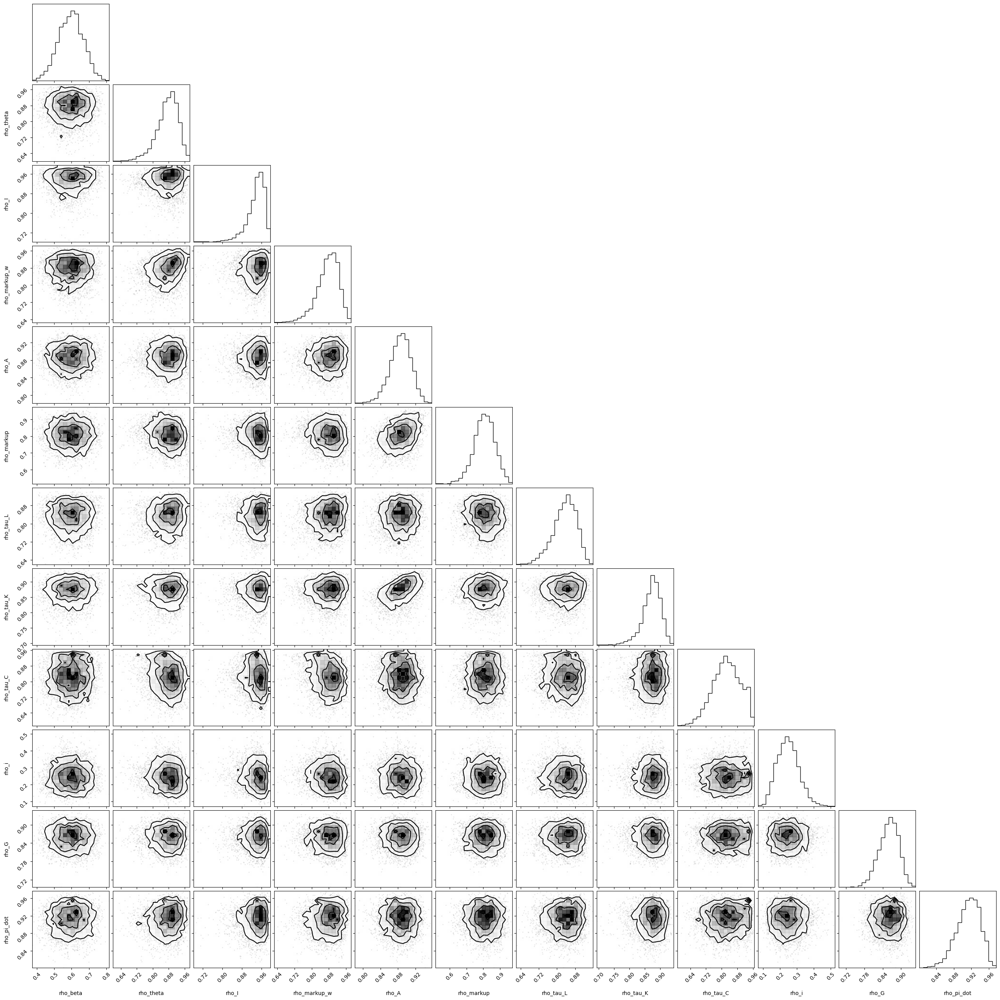

In [39]:
corner(idata, 
       var_names=rho_params, 
       divergences=False, 
       divergences_kwargs={'markersize':4, 'color':'tab:red'});

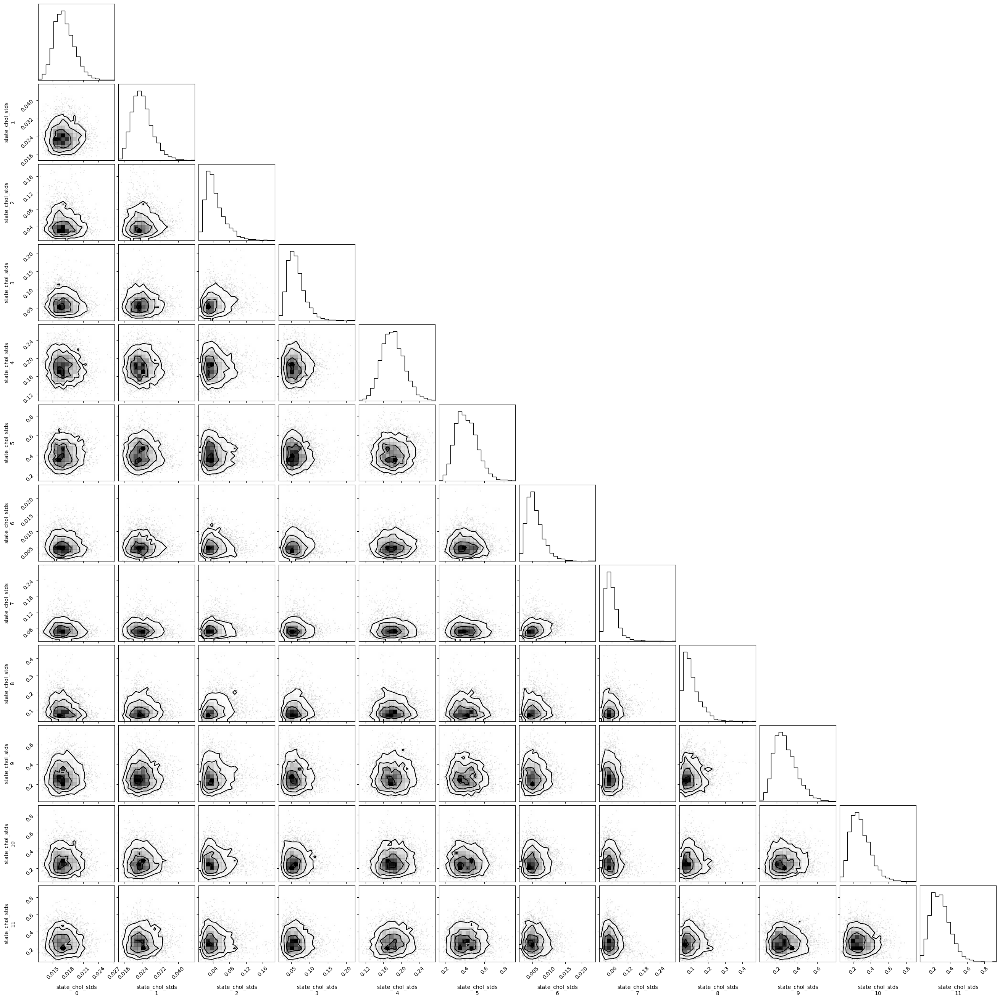

In [40]:
corner(idata, 
       var_names=['state_chol_stds'], 
       filter_vars='like',
       divergences=False, 
       divergences_kwargs={'markersize':4, 'color':'tab:red'});

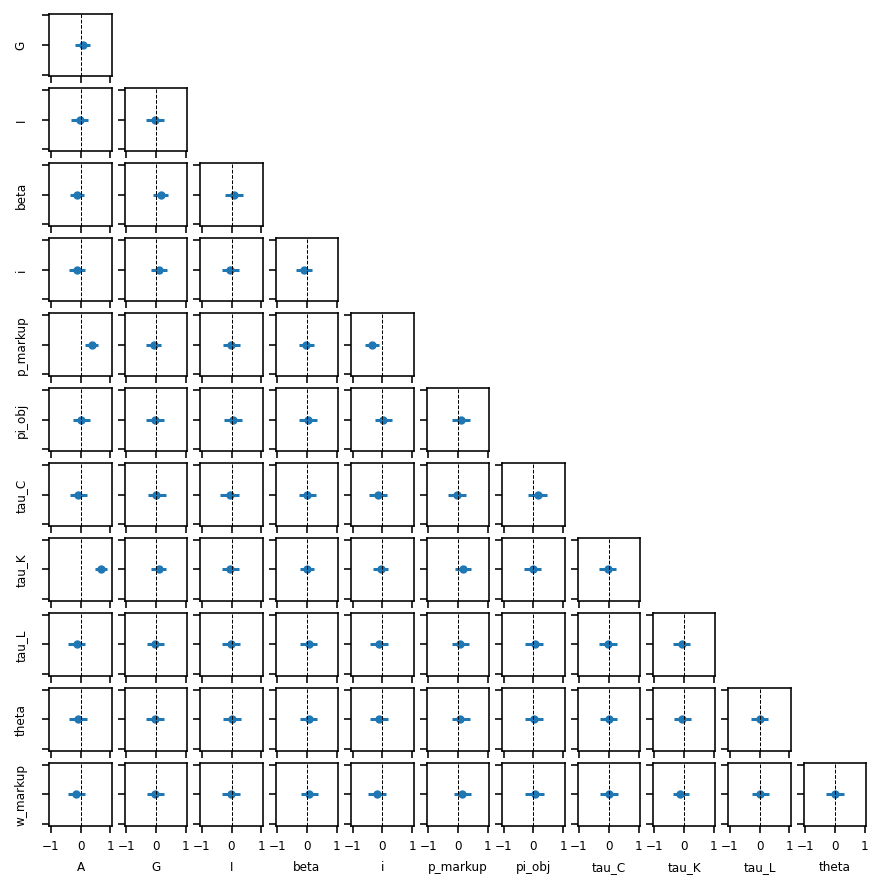

In [41]:
from itertools import product

n_shocks = dsge_mod.k_posdef

fig, ax = plt.subplots(n_shocks,
                      n_shocks,
                      figsize=(8, 8),
                      dpi=144,
                      subplot_kw={'aspect':'equal'},
                      sharex=True,
                      sharey=True)

mu_corr = idata.posterior.state_chol_corr.mean(dim=['chain', 'draw'])
hdi_corr = az.hdi(idata.posterior.state_chol_corr).state_chol_corr
ax[0, 0].set(xlim=(-1.05, 1.05), ylim=(-1.05, 1.05))

for i, j in product(range(n_shocks), range(n_shocks)):
    axis = ax[i, j]
    if i <= j:
        axis.set_visible(False)
        continue
    
    y_var = dsge_mod.shocks[i].base_name
    x_var = dsge_mod.shocks[j].base_name
    
    axis.scatter(mu_corr.values[i, j], 0, s=10)
    axis.hlines(0, *hdi_corr.values[i, j])
    axis.axvline(0, ls='--', c='k', lw=0.5)
    
    axis.set_ylabel(y_var.replace("epsilon_", "") if j == 0 else "", fontsize=6)
    axis.set_xlabel(x_var.replace("epsilon_", "") if i == (n_shocks - 1) else "", fontsize=6)

    axis.set_yticklabels([])
    axis.tick_params(axis='x', labelsize=6)

In [42]:
cond_post = dsge_mod.sample_conditional_posterior(idata)

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pymc_extras/statespace/utils/data_tools.py:159: ImputationWarning: Provided data contains missing values and will be automatically imputed as hidden states during Kalman filtering.
  warnings.warn(impute_message, ImputationWarning)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pytensor/link/jax/linker.py:27: UserWarning: The RandomType SharedVariables [RNG(<Generator(PCG64) at 0x3933B6F80>), RNG(<Generator(PCG64) at 0x3933B6EA0>), RNG(<Generator(PCG64) at 0x3933B6DC0>), RNG(<Generator(PCG64) at 0x3933B6CE0>), RNG(<Generator(PCG64) at 0x3933B6C00>), RNG(<Generator(PCG64) at 0x3AE5B58C0>)] will not be used in the compiled JAX graph. Instead a copy will be used.
  warnings.warn(
Sampling: [filtered_posterior, filtered_posterior_observed, predicted_posterior, predicted_posterior_observed, smoothed_posterior, smoothed_posterior_observed]


Output()

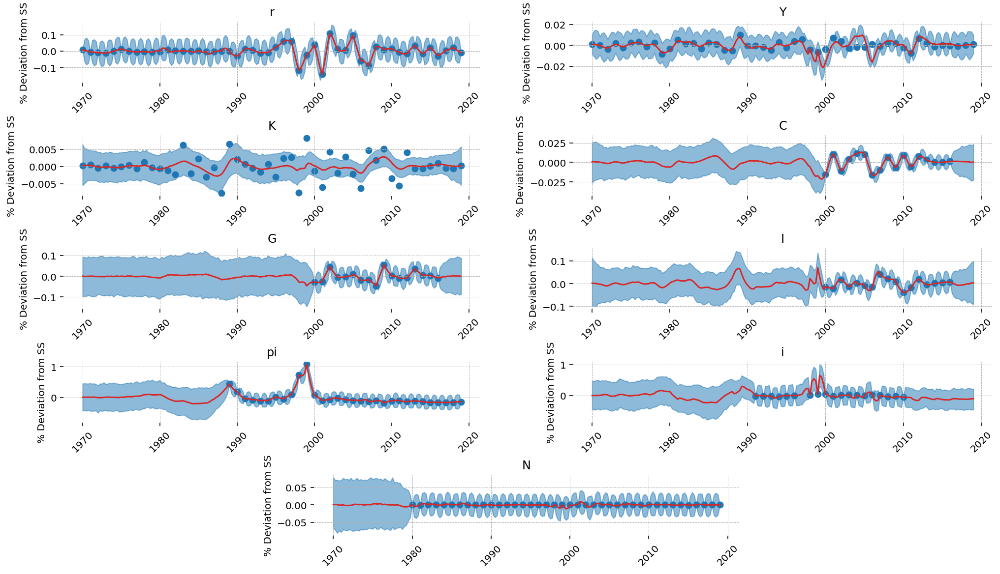

In [43]:
fig = gp.plot_kalman_filter(cond_post, 
                      df_final.drop(columns=['A']), 
                      kalman_output='smoothed', 
                      vars_to_plot=df_final.drop(columns=['A']).columns, 
                      n_cols=2,
                        figsize=(14,8));
for axis in fig.axes:
    var = axis.get_title()
    axis.scatter(df_final[var].index, df_final[var].values)

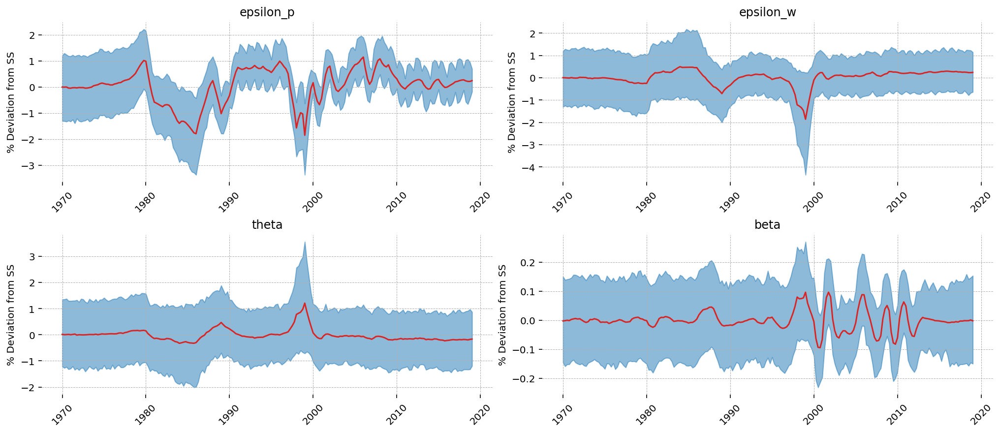

In [44]:
fig = gp.plot_kalman_filter(cond_post, 
                            df_detrend,
                      kalman_output='smoothed', 
                      vars_to_plot=['epsilon_p', 'epsilon_w', 'theta', 'beta'], 
                      n_cols=2);

### Retrend

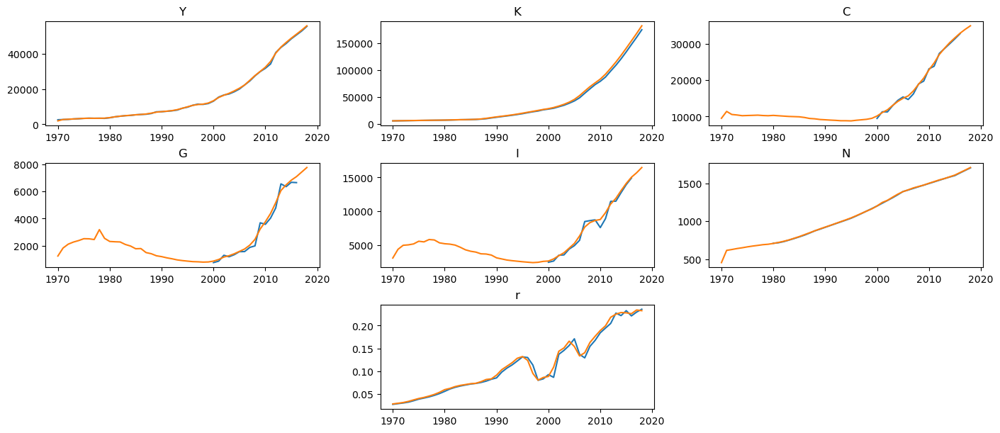

In [45]:
# data = np.exp(post_cond_trend.smoothed_posterior_observed + cond_post.smoothed_posterior_observed.isel(time=time_locs))

fig = plt.figure(figsize=(14, 6), layout='constrained')
gs, locs = gp.prepare_gridspec_figure(n_cols=3, n_plots=len(to_detrend), figure=fig)
for var, loc in zip(to_detrend, locs):
    trend = post_cond_trend.smoothed_posterior_observed.sel(observed_state=var)
    dsge_dynamics = cond_post.smoothed_posterior_observed.sel(observed_state=var)
    
    data = np.exp(trend + dsge_dynamics)
    y = data.mean(dim=['chain', 'draw']).to_dataframe()['smoothed_posterior_observed']
    y = y.resample('YS-OCT')
    if var in flow_variables:
        y = y.sum()
    else:
        y = y.last()
    
    axis = fig.add_subplot(gs[loc])
    axis.plot(df.index[:-1], df[var].values[:-1])
    axis.plot(df.index[:-1], y.values[:-1])
    axis.set_title(var)
    
plt.show()

In [46]:
def plot_irf(irf, vars_to_plot, n_cols=2, fig=None, figure_kwargs=None):
    n_plots = len(vars_to_plot)
    n_cols = min(n_plots, n_cols)
    
    if figure_kwargs is None:
        figure_kwargs = {}
    
    if fig is None:
        fig_defaults = dict(figsize=(14, 8), dpi=144, layout='constrained')
        fig_defaults.update(figure_kwargs)
        fig = plt.figure(**fig_defaults)
    
        gs, locs = gp.prepare_gridspec_figure(n_cols=n_cols, n_plots=n_plots, figure=fig)
    else:
        locs = None
        
    if hasattr(irf, "irf"):
        data = irf.irf.sel(state=vars_to_plot)
    else:
        data = irf
        
    mu = data.mean(dim=['chain', 'draw'])
    hdi = az.hdi(data).irf
    time = mu.time
    
    for i, variable in enumerate(vars_to_plot):
        if locs is not None:
            loc = locs[i]
            axis = fig.add_subplot(gs[loc])
        else:
            axis = fig.axes[i]
        axis.plot(time, mu.sel(state=variable))
        axis.fill_between(time, *hdi.sel(state=variable).values.T, alpha=0.2)
        axis.set_title(variable)
    
    return fig

Sampling: []


Output()

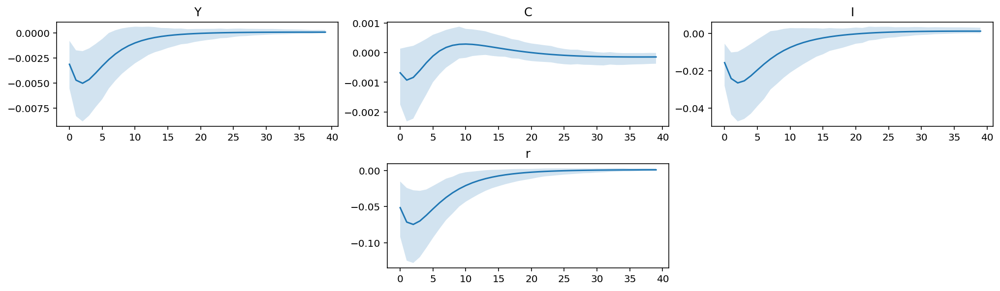

In [47]:
shock_size = np.zeros(dsge_mod.k_posdef)

idx = dsge_mod.shock_names.index('epsilon_p_markup')
shock_size[idx] = 1.0

irf = dsge_mod.impulse_response_function(idata,
                                         n_steps=40,
                                         shock_size=shock_size)

plot_irf(irf, ['Y', 'C', 'I', 'r'], n_cols=3, figure_kwargs=dict(figsize=(14, 4)));

# Scenarios

In [48]:
scenario_mod = ge.statespace_from_gcn('nk_complete_taxes_w_capital_shock.gcn',
                                      not_loglin_variables=['U', 'i', 'pi', 'pi_obj', 'tau_C', 'tau_K', 'tau_L'])

scenario_mod.configure(observed_states=df_final.columns,
                   measurement_error=error_vars,
                   constant_params=['pi_bar', 
                                    'phi_tau_C', 'phi_tau_K', 'phi_tau_L',
                                    'psi',
                                    'tau_C', 'tau_K', 'tau_L',
                                    'rho_K'],
                   full_shock_covaraince=True,
                   solver='scan_cycle_reduction',
                   mode='JAX',
                   max_iter=20,
                   use_adjoint_gradients=True)

Model Building Complete.
Found:
	36 equations
	36 variables
		The following variables were eliminated at user request:
			D_t, K_d_t, N_i_t, TC_t, T_t, Y_j_t
		The following "variables" were defined as constants and have been substituted away:
			B_t
	13 stochastic shocks
		 0 / 13 has a defined prior. 
	36 parameters
		 27 / 36 parameters has a defined prior. 
	0 parameters to calibrate.
Model appears well defined and ready to proceed to solving.

Statespace model construction complete, but call the .configure method to finalize.


                              Model Requirements                              
                                                                              
  Variable        Shape      Constraints                          Dimensions  
 ──────────────────────────────────────────────────────────────────────────── 
  alpha           ()                                                    None  
  beta            ()                                                    None  
  chi             ()                                                    None  
  delta           ()                                                    None  
  epsilon_p       ()                                                    None  
  epsilon_w       ()                                                    None  
  gamma_I         ()                                                    None  
  phi_H           ()                                                    None  
  phi_Y           ()                                                    None  
  phi_p           ()                                                    None  
  phi_pi          ()                                                    None  
  phi_w           ()                                                    None  
  psi_z           ()                                                    None  
  rho_A           ()                                                    None  
  rho_G           ()                                                    None  
  rho_I           ()                                                    None  
  rho_beta        ()                                                    None  
  rho_i           ()                                                    None  
  rho_markup      ()                                                    None  
  rho_markup_w    ()                                                    None  
  rho_pi_dot      ()                                                    None  
  rho_tau_C       ()                                                    None  
  rho_tau_K       ()                                                    None  
  rho_tau_L       ()                                                    None  
  rho_theta       ()                                                    None  
  sigma           ()         Positive                                   None  
  theta           ()                                                    None  
  state_cov       (13, 13)   Positive Semi-Definite   ('shock', 'shock_aux')  
  error_sigma_N   ()                                                    None  
  error_sigma_K   ()                                                    None  
  error_sigma_A   ()                                                    None  
                                                                              
 These parameters should be assigned priors inside a PyMC model block before  
                  calling the build_statespace_graph method.                  

In [49]:
with pm.Model(coords=dsge_mod.coords) as pm_mod:
    scenario_mod.to_pymc()
    for name, prior in error_priors.items():
        prior.to_pymc(name=name)
    chol, *_ = pm.LKJCholeskyCov('state_chol', 
                                 n=scenario_mod.k_posdef, 
                                 eta=25, 
                                 sd_dist=sd_dist)
    cov = pm.Deterministic('state_cov', chol @ chol.T, dims=['shock', 'shock_aux'])

    scenario_mod.build_statespace_graph(df_final,
                                        add_norm_check=True,
                                        add_solver_success_check=True,
                                        add_steady_state_penalty=True)

/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pymc_extras/statespace/utils/data_tools.py:159: ImputationWarning: Provided data contains missing values and will be automatically imputed as hidden states during Kalman filtering.
  warnings.warn(impute_message, ImputationWarning)


In [50]:
for attr in ['_fit_coords', '_fit_data', '_fit_dims', '_fit_mode']:
    setattr(scenario_mod, attr, getattr(dsge_mod, attr))

In [51]:
scenario_mod._fit_coords = scenario_mod.coords

In [52]:
import re
from pandas_datareader.fred import FredReader

In [53]:
usa_cpi = FredReader(symbols=['CPIAUCNS'], start='1900-01-01', end='2200-01-01').read()
usa_cpi_annual = usa_cpi.resample('YS').mean()

cpi_2017 = usa_cpi_annual.loc['2017-01-01'].item()
cpi_2018 = usa_cpi_annual.loc['2018-01-01'].item()
cpi_2025 = usa_cpi_annual.loc['2025-01-01'].item()

In [54]:
regional_gdp_share = pd.read_csv(here('data/lao_regional_gdp.csv'), index_col=0)

In [55]:
vt_size = regional_gdp_share.loc['Vientiane Capital', '2022'] / 100

In [56]:
pattern = r"1-in-(\d+(?:\.\d+)?) year"
damage_df = (pd.read_csv('return_years_table_final.csv', index_col=0)
               .rename(columns=lambda x: pd.to_datetime(x, format='%Y'))
               .T
               .rename(columns=lambda x: int(re.match(pattern, x).group(1).split('.')[0])))

Capital stock data is in millions of 2018 USD. Convert to LAK for reporting.

In [57]:
pattern = r"(\d+(?:\.\d+)?) RY"

damage_df2 = (pd.read_csv(here('data/return_years_table_final_usd_millions.csv'), index_col=0, header=0)
               .rename(columns=lambda x: pd.to_datetime(x, format='%Y'))
              .T
               .rename(columns=lambda x: int(re.match(pattern, x).group(1).split('.')[0])))

In [58]:
K_USD = pwt_df['capital_stock'] * (cpi_2018 / cpi_2017)

Damages are in 2018 USD, so that's good

In [59]:
xr_2025 = 21631.82  # Got this from google 03/22/25 --> LAK / USD
xr_2017 = wb_data.exchange_rate.loc["2017"].item()

damage_pct = damage_df2 / (K_USD.loc['2017'].item())

In [60]:
damage_pct

return_years,100,50,40,30,25,20,10,4,2,1
2015-01-01,0.004609,0.002682,0.001880,0.001361,0.001107,0.000855,0.000296,0.000051,0.000002,0.000000
2025-01-01,0.013006,0.006236,0.004846,0.003586,0.002847,0.002146,0.000889,0.000169,0.000015,0.000000
2035-01-01,0.018634,0.011135,0.008223,0.005941,0.004839,0.003817,0.001426,0.000302,0.000039,0.000000
2045-01-01,0.024476,0.013433,0.010801,0.007807,0.006372,0.004930,0.002018,0.000411,0.000064,0.000004
2055-01-01,0.028979,0.014898,0.011840,0.008664,0.007315,0.005996,0.002565,0.000561,0.000092,0.000011


In [61]:
print(damage_pct.to_string())

return_years       100       50        40        30        25        20        10        4         2         1  
2015-01-01    0.004609  0.002682  0.001880  0.001361  0.001107  0.000855  0.000296  0.000051  0.000002  0.000000
2025-01-01    0.013006  0.006236  0.004846  0.003586  0.002847  0.002146  0.000889  0.000169  0.000015  0.000000
2035-01-01    0.018634  0.011135  0.008223  0.005941  0.004839  0.003817  0.001426  0.000302  0.000039  0.000000
2045-01-01    0.024476  0.013433  0.010801  0.007807  0.006372  0.004930  0.002018  0.000411  0.000064  0.000004
2055-01-01    0.028979  0.014898  0.011840  0.008664  0.007315  0.005996  0.002565  0.000561  0.000092  0.000011


In [62]:
from tqdm.notebook import tqdm

In [63]:
K_idx = scenario_mod.shock_names.index('epsilon_K')
A_idx = scenario_mod.shock_names.index('epsilon_A')
all_irfs = None

for (size, year) in tqdm(damage_pct.unstack().index):
    shock_size = np.zeros(scenario_mod.k_posdef)

    val = damage_pct.loc[year, size].item()
    shock_size[K_idx] = -val
    shock_size[A_idx] = -1.5 * val

    irf = scenario_mod.impulse_response_function(idata,
                                                 n_steps=36,
                                                 shock_size=shock_size,
                                                 progressbar=False)
    xr_idx = xr.Coordinates.from_pandas_multiindex(pd.MultiIndex.from_tuples([(size, year)], 
                                                                             names=['size', 'year']), 
                                                   'scenario')
    irf = irf.irf.expand_dims(scenario=[0]).assign_coords(xr_idx)

    if all_irfs is None:
        all_irfs = irf
    else:
        all_irfs = xr.concat([all_irfs, irf], dim='scenario')

  0%|          | 0/50 [00:00<?, ?it/s]

Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


In [64]:
plot_vars = ['Y', 'N', 'C', 'I', 'K', 'r']

In [65]:
irf_dates = pd.date_range(start='2018-01-01', periods=36, freq=df_final.index.inferred_freq)
all_irfs.coords['time'] = irf_dates

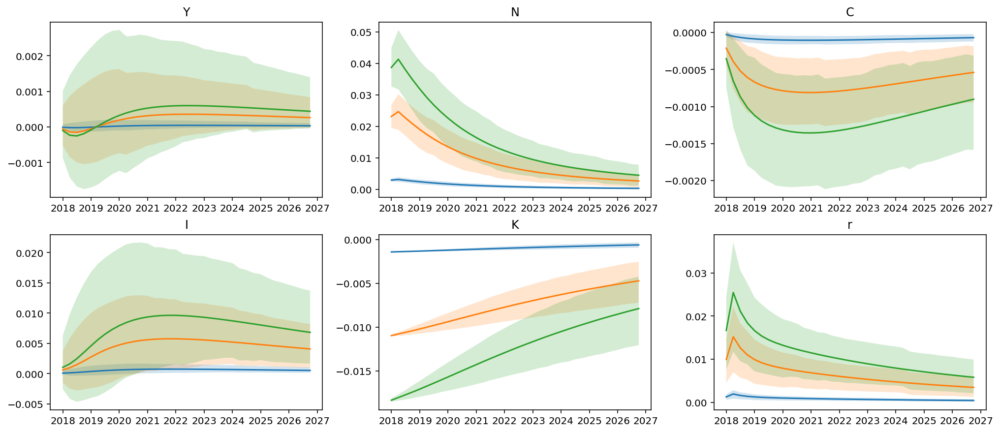

In [66]:
fig = plot_irf(all_irfs.sel(size=10, year='2035').squeeze('scenario'), 
         plot_vars, 
         n_cols=3, 
         figure_kwargs=dict(figsize=(14, 6)))

fig = plot_irf(all_irfs.sel(size=50, year='2035').squeeze('scenario'), 
         plot_vars, 
         n_cols=3, 
         fig=fig)

fig = plot_irf(all_irfs.sel(size=100, year='2035').squeeze('scenario'), 
         plot_vars, 
         n_cols=3, 
         fig=fig)

plt.show()

In [67]:
missing_dates = set(irf_dates) - set(df_final.index)
n_forecasts = len(missing_dates)
n_forecasts

31

In [68]:
idata_forecast = dsge_mod.forecast(idata, periods=n_forecasts)

No start date provided. Using the last date in the data index. To silence this warning, explicitly pass a start date or set verbose = False
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pymc_extras/statespace/utils/data_tools.py:159: ImputationWarning: Provided data contains missing values and will be automatically imputed as hidden states during Kalman filtering.
  warnings.warn(impute_message, ImputationWarning)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pytensor/link/jax/linker.py:27: UserWarning: The RandomType SharedVariables [RNG(<Generator(PCG64) at 0x3B39CB760>)] will not be used in the compiled JAX graph. Instead a copy will be used.
  warnings.warn(
Sampling: [forecast_combined]


Output()

In [69]:
trend_forecast = trend_mod.forecast(trend_idata, periods=n_forecasts)

No start date provided. Using the last date in the data index. To silence this warning, explicitly pass a start date or set verbose = False
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pymc_extras/statespace/utils/data_tools.py:159: ImputationWarning: Provided data contains missing values and will be automatically imputed as hidden states during Kalman filtering.
  warnings.warn(impute_message, ImputationWarning)
/Users/jessegrabowski/mambaforge/envs/laos-climate-change/lib/python3.12/site-packages/pytensor/link/jax/linker.py:27: UserWarning: The RandomType SharedVariables [RNG(<Generator(PCG64) at 0x39B739380>)] will not be used in the compiled JAX graph. Instead a copy will be used.
  warnings.warn(
Sampling: [forecast_combined]


Output()

In [70]:
trend_concat = xr.concat([post_cond_trend.smoothed_posterior_observed,
                          trend_forecast.forecast_observed],
                         dim='time')
dsge_concat = xr.concat([cond_post.smoothed_posterior_observed,
                         idata_forecast.forecast_observed],
                        dim='time')

In [71]:
from matplotlib.dates import DateFormatter, YearLocator, MonthLocator

def make_analysis_data(trend, 
                       irfs, 
                       size, 
                       year, 
                       var_names, 
                       lead_up:int = 8,
                       adj_factor: float | None = None,
                       dont_adjust: list[str] | None = None):
    
    # Output of the DSGE is in millions of 2015/17 USD (I was a bit sloppy here)
    # But if we want to report at some other time/currency, pass in the relevant CPI and exchange rate
    # adjustment
    if adj_factor is None:
        adj_factor = 1
    if dont_adjust is None:
        dont_adjust = []
    
    shock_date = all_irfs.coords['time'].to_series().index.shift(-lead_up)[0]
    plot_dates = pd.date_range(shock_date, periods=len(irfs.coords['time']) + lead_up, freq='QS-OCT')

    trend = trend.sel(observed_state=var_names)
    irf_dynamics = irfs.sel(state=var_names, size=size).squeeze()
    
    if isinstance(year, list):
        irf_dynamics = xr.concat([irf_dynamics.sel(year=y) for y in year],
                                dim='year').transpose(..., 'year', 'time', 'state')
        trend = trend.expand_dims(year=year).transpose(..., 'year', 'time', 'observed_state')
        
    else:
        irf_dynamics = irf_dynamics.sel(year=year).squeeze()
        
    irf_dynamics = irf_dynamics.pad(pad_width={'time':(lead_up, 0)}, mode='constant', constant_values=0)
    
    xr_adj = xr.DataArray(np.array([1.0 if x in dont_adjust else adj_factor for x in var_names]),
             dims=['observed_state'],
             coords={'observed_state':var_names})    
    
    data = np.exp(trend.sel(time=plot_dates) + irf_dynamics.values) * xr_adj
    trend_data = np.exp(trend).sel(time=plot_dates) * xr_adj
    
    return xr.Dataset({'scenario':data, 
                       'trend':trend_data,
                       'delta': data - trend_data,
                       'pct_change': (data - trend_data) / trend_data,
                       'cum_delta': (data - trend_data).cumsum(dim='time')})

def plot_analysis(data, 
                  kind='level', 
                  shade_after_date=None,
                  title_rename_dict=None,
                  hdi_prob=0.94,
                  summary_stat='mean'):
    
    assert summary_stat in ['mean', 'median']
    
    def plot_one(data, plot_groups, axis, label=None, hdi_prob=0.94, summary_stat='mean'):
        for group in plot_groups:
            mu = data[group].sel(observed_state=var)
            if summary_stat == 'mean':
                mu = mu.mean(dim=['chain', 'draw'])
            elif summary_stat == 'median':
                mu = mu.quantile(0.5, dim=['chain', 'draw'])
            else:
                raise NotImplementedError
                
            hdi = az.hdi(data[group].sel(observed_state=var), hdi_prob=hdi_prob)[group]
            
            axis.plot(plot_dates, mu.values, label=label)
            axis.fill_between(plot_dates, *hdi.values.T, alpha=0.25)
    
    if title_rename_dict is None:
        title_rename_dict = {}
    
    var_names = data.coords['observed_state']
    plot_dates = data.coords['time'].values
    
    fig = plt.figure(figsize=(14, 6), layout='constrained')
    
    gs, locs = gp.prepare_gridspec_figure(n_cols=3, n_plots=len(var_names), figure=fig)
    
    if kind == 'level':
        plot_groups = ['scenario', 'trend']
    elif kind == 'delta':
        plot_groups = ['delta']
    elif kind == 'cum_delta':
        plot_groups = ['cum_delta']
    
    for var, loc in zip(plot_vars, locs):
        axis = fig.add_subplot(gs[loc])
        
        if 'year' in data.coords and data.coords['year'].shape and len(data.coords['year']) > 1:
            for year in data.coords['year']:
                year = pd.to_datetime(year.values)
                plot_one(data.sel(year=year), plot_groups, axis, label=year.year, 
                         hdi_prob=hdi_prob,
                         summary_stat=summary_stat)
        else:
            plot_one(data, plot_groups, axis, hdi_prob=hdi_prob, summary_stat=summary_stat)
        ylims = axis.get_ylim()
    
        if shade_after_date:
            last_insample = np.flatnonzero(plot_dates == shade_after_date).item()
            axis.fill_between(plot_dates[last_insample:], *ylims, color='tab:purple', alpha=0.1)
    
        axis.set(title=title_rename_dict.get(var, var), ylim=ylims)
        axis.xaxis.set_major_locator(YearLocator(2))
        axis.xaxis.set_minor_locator(MonthLocator(interval=3))
    
    if 'year' in data.coords and data.coords['year'].shape and len(data.coords['year']) > 1:
        fig.axes[0].legend()
        
    plt.show()

In [72]:
def make_paper_table(data, lead_up:int = 4, short_years=1, long_years=4):
    short_quarters = short_years * 4
    long_quarters = long_years * 4
    
    short_slice = slice(lead_up, lead_up + short_quarters)
    long_slice = slice(lead_up + short_quarters, lead_up + short_quarters + long_quarters)
    total_slice = slice(lead_up, lead_up + short_quarters + long_quarters)

    short_term = data.isel(time=short_slice)
    long_term = data.isel(time=long_slice)
    total_term = data.isel(time=total_slice)
    
    s_T = len(short_term.coords['time'])
    l_T = len(long_term.coords['time'])
    t_T = len(total_term.coords['time'])
    
    pct_change = xr.Dataset({
        'short_term':(short_term.pct_change + 1).prod(dim='time') ** (1 / s_T) - 1,
        'long_term':(long_term.pct_change + 1).prod(dim='time') ** (1 / l_T) - 1 ,
        'total':(total_term.pct_change + 1).prod(dim='time') ** (1 / t_T) - 1
    })
    
    total_diff = xr.Dataset({
        'short_term':short_term.delta.sum(dim='time'),
        'long_term':long_term.delta.sum(dim='time'),
        'total':total_term.delta.sum(dim='time')
    })
    
    all_data = xr.concat([pct_change.expand_dims(kind = ['pct_change']), 
                      total_diff.expand_dims(kind = ['diff'])], 
                     dim='kind')
    
    data_mean = all_data.mean(dim=['chain', 'draw'])
    data_hdi = az.hdi(all_data)
    
    data_df = data_mean.to_dataframe().unstack('observed_state')
    hdi_df = data_hdi.to_dataframe().unstack('observed_state')

    def format_cells(x):
        hdi_values = hdi_df[x.name].unstack('hdi')
        def make_hdi(x, idx, pct=False):
            hdi = hdi_values.loc[idx]
            return f'({hdi.lower:0.2%}, {hdi.higher:0.2%})' if pct else f'({hdi.lower:0.2f}, {hdi.higher:0.2f})'
        return [f'{x:0.2%}\\n{make_hdi(x, idx, True)}' if idx[0] == 'pct_change' 
                else f'{x:0.2f}\\n{make_hdi(x, idx)}' for idx, x in zip(x.index, x.values)]
    
    variables = data.coords['observed_state'].values
    sorted_columns = [(var, horizon) for var in variables for horizon in ['short_term', 'long_term', 'total']]
    data_df = (data_df.apply(format_cells)
            .swaplevel(axis=1)
            .sort_index(axis=1)
            .sort_index(axis=0, level=1)
            .loc[:, sorted_columns])
    return data_df

In [73]:
from collections import Counter

def dataframe_to_typst(df: pd.DataFrame) -> str:
    num_cols = df.shape[1] + 1

    has_multiindex = isinstance(df.columns, pd.MultiIndex)
    num_header_levels = df.columns.nlevels if has_multiindex else 1
    row_auto = "(" + "auto, " * num_header_levels + "2pt,)"

    typst_table = [
        f'tablex(',
        f'  columns: (0.8fr, ) + ({", ".join(["1fr"] * (num_cols - 1))}),',
        f'  rows: {row_auto} + (auto,) * {len(df)},',
        f'  align: left + horizon,',
        f'  auto-lines: false,',
        f'  inset: 5pt,',
        f'  stroke: .5pt + gray,',
        '''
        map-rows: (row, cells) => cells.map(c =>
            if c == none { 
                c  // keeping 'none' is important
            } else {
                (..c, fill: if row == 0 { OECD_blue } else if
                  row > 0 and row < 3 { white } else if 
                    calc.rem(row, 2) == 0 { OECD_blue } 
                        else { white })
                    }
        ),
        map-cells: cell => {
            (..cell, content: text(stretch: 75%, cell.content))
        },
        ''',
        f'  hlinex(stroke: black + 3pt),'

    ]

    if has_multiindex:
        levels = list(df.columns.levels)
        codes = list(df.columns.codes)
        names = list(df.columns.names)
        
        codes_0 = codes.pop(0)
        levels_0 = levels.pop(0)
        name_0 = names.pop(0)
                
        c = Counter()
        c.update(codes_0)
        first_header = []
        for idx, span in c.items():
            first_header.append(f'colspanx({span})[#align(center, [#text(8pt)[{levels_0[idx]}]])]')
        
#         first_header = f'colspanx({first_header_span})[#align(center, [{levels[0][codes[0][0]]}])]'
        typst_table.append(f'  [],' + ','.join(first_header) + ',')

        # Handle remaining header levels
        for name, level, code in zip(names, levels, codes):
            level_name = f'[#text(6.5pt)[{name}]]' if name else '[]'
            typst_table.append('  hlinex(stroke: black + 1.0pt),')
            header_row = ', '.join(f'[#text(7pt)[{level[idx]}]]' for idx in code)
            typst_table.append(f'  {level_name}, {header_row},')

    else:
        headers = ', '.join(f'[{col}]' for col in df.columns)
        typst_table.append(f'  {headers},')
        typst_table.append('  hlinex(stroke: black + 1.0pt),')

    
    # Double line separator 
    typst_table.append(f'  hlinex(stroke: black + 0.5pt),')
    typst_table.append(f'  colspanx({num_cols})[],')
    typst_table.append(f'  hlinex(stroke: black + 0.5pt),')

    for idx, row in df.iterrows():
        row_data = ', '.join(f'[#text(6pt)[{str(cell).replace(r"\n", " #linebreak() ")}]]' for cell in row)
        typst_table.append(f'  [#text(6.5pt)[{idx}]], {row_data},')

    typst_table.append(f'  hlinex(stroke: black + 3pt),')
    typst_table.append(')')

    return '\n'.join(typst_table)


In [74]:
horizon_to_quarters = {'short_term': '4-7', 'long_term': '8-24', 'total':'4-24'}
horizon_to_long_name = {'short_term': 'Shock Year', 'long_term':'Post Shock Years', 'total':'Total'}
var_name_to_long = {'Y': 'GDP (Billion LAK)',
                    'K': 'Capital Stock (Billion LAK)',
                    'N': 'Employment Rate',
                    'C': 'Household Consumption (Billion LAK)'}

idx_to_long = {'diff': 'Total Difference', 'pct_change': 'Average Quarterly Difference'}

In [75]:
analysis_data = xr.concat([
    make_analysis_data(trend_concat,
                                   all_irfs, 
                                   size=ry, 
                                   year=damage_df2.index.tolist(),
                                   var_names=plot_vars,
                                   lead_up=4,
                                   # Data are millions of 2017 USD but damages are in 2018 USD
                                   adj_factor=(cpi_2017 / cpi_2018),
                                   dont_adjust=['N', 'r']).expand_dims(return_year = [ry])
    for ry in damage_pct.columns
], dim='return_year')

## 50 RY 

In [76]:
from IPython.display import HTML
table_50RY = make_paper_table(analysis_data.sel(return_year=50))
display(HTML(table_50RY.to_html(notebook=True).replace("\\n","<br>")))

### 2015

In [77]:
table_50RY_2015 = table_50RY.xs(level=1, key='2015').loc[:, ['Y', 'K', 'C']]
col_tuples = [(var_name_to_long.get(x[0]), 
               horizon_to_long_name.get(x[1]),
               horizon_to_quarters.get(x[1])) 
              for x in table_50RY_2015.columns.values]
table_50RY_2015.columns = pd.MultiIndex.from_tuples(col_tuples, names=[None, None, 'Quarters'])
table_50RY_2015.index = [idx_to_long.get(x[0]) for x in table_50RY_2015.index]

print(dataframe_to_typst(table_50RY_2015))

tablex(
  columns: (0.8fr, ) + (1fr, 1fr, 1fr, 1fr, 1fr, 1fr, 1fr, 1fr, 1fr),
  rows: (auto, auto, auto, 2pt,) + (auto,) * 2,
  align: left + horizon,
  auto-lines: false,
  inset: 5pt,
  stroke: .5pt + gray,

        map-rows: (row, cells) => cells.map(c =>
            if c == none { 
                c  // keeping 'none' is important
            } else {
                (..c, fill: if row == 0 { OECD_blue } else if
                  row > 0 and row < 3 { white } else if 
                    calc.rem(row, 2) == 0 { OECD_blue } 
                        else { white })
                    }
        ),
        map-cells: cell => {
            (..cell, content: text(stretch: 75%, cell.content))
        },
        
  hlinex(stroke: black + 3pt),
  [],colspanx(3)[#align(center, [#text(8pt)[GDP (Billion LAK)]])],colspanx(3)[#align(center, [#text(8pt)[Capital Stock (Billion LAK)]])],colspanx(3)[#align(center, [#text(8pt)[Household Consumption (Billion LAK)]])],
  hlinex(stroke: black + 1.0pt),

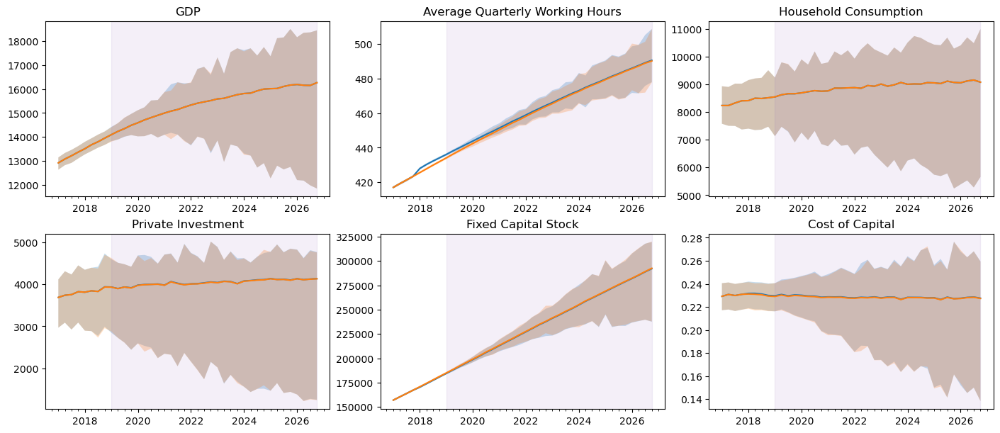

In [78]:
plot_analysis(analysis_data.sel(return_year=50, year='2015').squeeze(),
              shade_after_date=df_final.index[-1],
              kind='level',
              title_rename_dict={'Y': 'GDP',
                                 'N': 'Average Quarterly Working Hours',
                                 'C': 'Household Consumption',
                                 'I': 'Private Investment',
                                 'K': 'Fixed Capital Stock',
                                 'r': 'Cost of Capital'},
             hdi_prob=0.5,
             summary_stat='median')

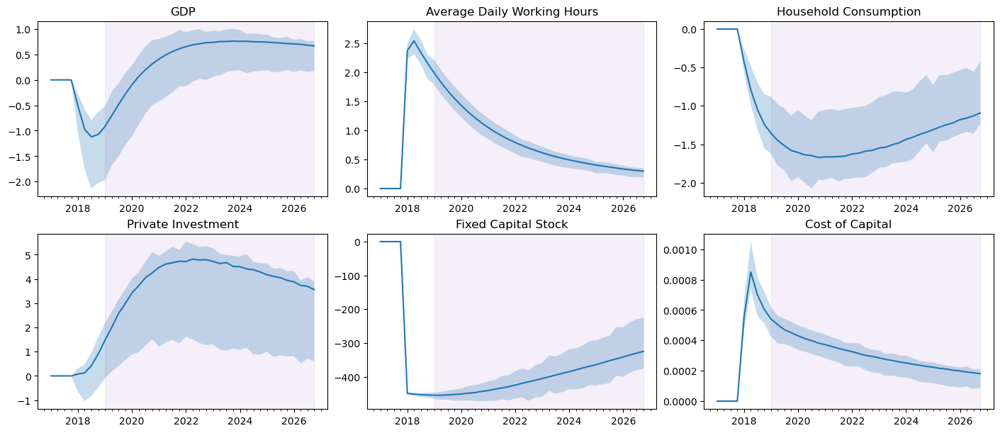

In [79]:
plot_analysis(analysis_data.sel(return_year=50, year='2015').squeeze(),
              shade_after_date=df_final.index[-1],
              kind='delta',
              title_rename_dict={'Y': 'GDP',
                                 'N': 'Average Daily Working Hours',
                                 'C': 'Household Consumption',
                                 'I': 'Private Investment',
                                 'K': 'Fixed Capital Stock',
                                 'r': 'Cost of Capital'},
              hdi_prob=0.5,
              summary_stat='median')

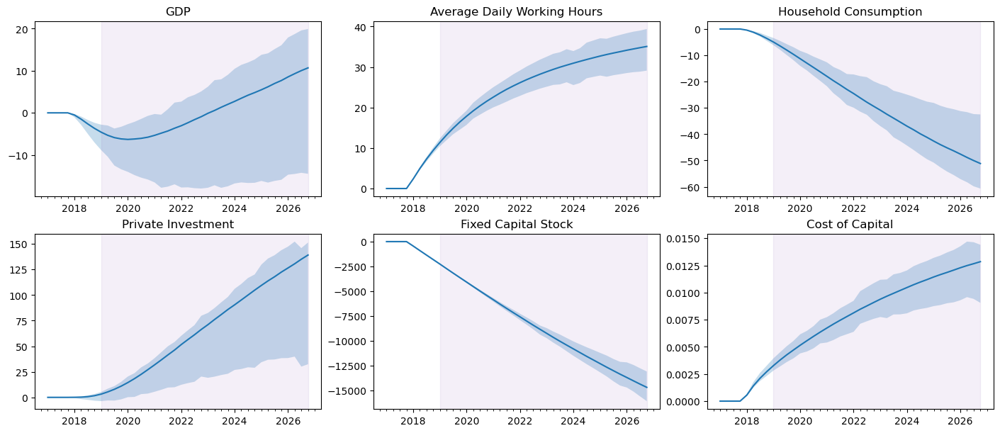

In [80]:
plot_analysis(analysis_data.sel(return_year=50, year='2015').squeeze(),
              shade_after_date=df_final.index[-1],
              kind='cum_delta',
              title_rename_dict={'Y': 'GDP',
                                 'N': 'Average Daily Working Hours',
                                 'C': 'Household Consumption',
                                 'I': 'Private Investment',
                                 'K': 'Fixed Capital Stock',
                                 'r': 'Cost of Capital'},
              hdi_prob=0.5,
              summary_stat='median')

### 2055

In [81]:
table_50RY_2055 = table_50RY.xs(level=1, key='2055').loc[:, ['Y', 'K', 'C']]
col_tuples = [(var_name_to_long.get(x[0]), 
               horizon_to_long_name.get(x[1]),
               horizon_to_quarters.get(x[1])) 
              for x in table_50RY_2055.columns.values]
table_50RY_2055.columns = pd.MultiIndex.from_tuples(col_tuples, names=[None, None, 'Quarters'])
table_50RY_2055.index = [idx_to_long.get(x[0]) for x in table_50RY_2055.index]

print(dataframe_to_typst(table_50RY_2055))

tablex(
  columns: (0.8fr, ) + (1fr, 1fr, 1fr, 1fr, 1fr, 1fr, 1fr, 1fr, 1fr),
  rows: (auto, auto, auto, 2pt,) + (auto,) * 2,
  align: left + horizon,
  auto-lines: false,
  inset: 5pt,
  stroke: .5pt + gray,

        map-rows: (row, cells) => cells.map(c =>
            if c == none { 
                c  // keeping 'none' is important
            } else {
                (..c, fill: if row == 0 { OECD_blue } else if
                  row > 0 and row < 3 { white } else if 
                    calc.rem(row, 2) == 0 { OECD_blue } 
                        else { white })
                    }
        ),
        map-cells: cell => {
            (..cell, content: text(stretch: 75%, cell.content))
        },
        
  hlinex(stroke: black + 3pt),
  [],colspanx(3)[#align(center, [#text(8pt)[GDP (Billion LAK)]])],colspanx(3)[#align(center, [#text(8pt)[Capital Stock (Billion LAK)]])],colspanx(3)[#align(center, [#text(8pt)[Household Consumption (Billion LAK)]])],
  hlinex(stroke: black + 1.0pt),

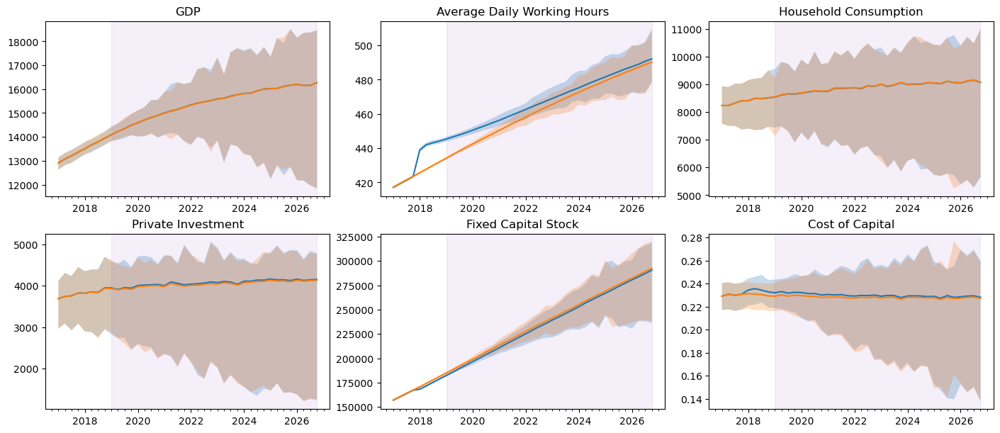

In [82]:
plot_analysis(analysis_data.sel(return_year=50, year=['2055']).squeeze(),
              shade_after_date=df_final.index[-1],
              kind='level',
              title_rename_dict={'Y': 'GDP',
                                 'N': 'Average Daily Working Hours',
                                 'C': 'Household Consumption',
                                 'I': 'Private Investment',
                                 'K': 'Fixed Capital Stock',
                                 'r': 'Cost of Capital'},
              hdi_prob=0.5,
              summary_stat='median')

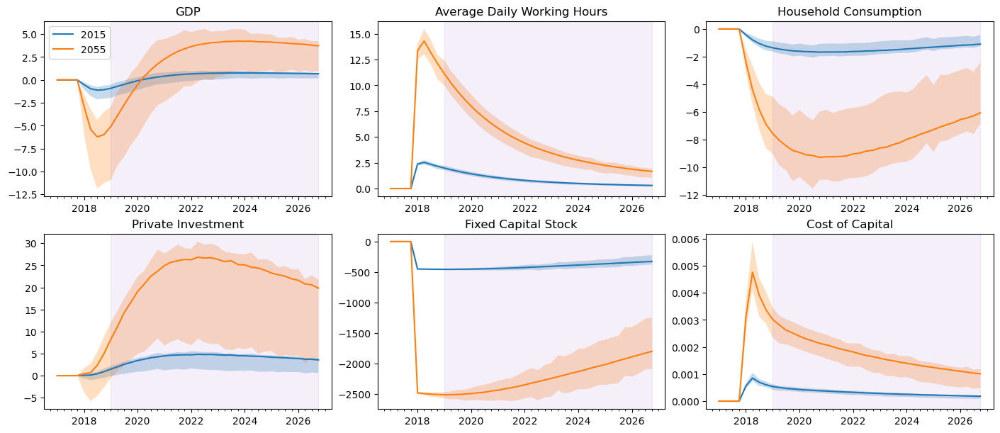

In [83]:
plot_analysis(analysis_data.sel(return_year=50, year=['2015', '2055']),
              shade_after_date=df_final.index[-1],
              kind='delta',
              title_rename_dict={'Y': 'GDP',
                                 'N': 'Average Daily Working Hours',
                                 'C': 'Household Consumption',
                                 'I': 'Private Investment',
                                 'K': 'Fixed Capital Stock',
                                 'r': 'Cost of Capital'},
              hdi_prob=0.5,
              summary_stat='median')

## 100 RY

In [84]:
from IPython.display import HTML
table_100RY = make_paper_table(analysis_data.sel(return_year=100))
display(HTML(table_100RY.to_html(notebook=True).replace("\\n","<br>")))

In [85]:
table_100RY_2015 = table_100RY.xs(level=1, key='2015').loc[:, ['Y', 'K', 'C']]
col_tuples = [(var_name_to_long.get(x[0]), 
               horizon_to_long_name.get(x[1]),
               horizon_to_quarters.get(x[1])) 
              for x in table_100RY_2015.columns.values]
table_100RY_2015.columns = pd.MultiIndex.from_tuples(col_tuples, names=[None, None, 'Quarters'])
table_100RY_2015.index = [idx_to_long.get(x[0]) for x in table_100RY_2015.index]

print(dataframe_to_typst(table_100RY_2015))

tablex(
  columns: (0.8fr, ) + (1fr, 1fr, 1fr, 1fr, 1fr, 1fr, 1fr, 1fr, 1fr),
  rows: (auto, auto, auto, 2pt,) + (auto,) * 2,
  align: left + horizon,
  auto-lines: false,
  inset: 5pt,
  stroke: .5pt + gray,

        map-rows: (row, cells) => cells.map(c =>
            if c == none { 
                c  // keeping 'none' is important
            } else {
                (..c, fill: if row == 0 { OECD_blue } else if
                  row > 0 and row < 3 { white } else if 
                    calc.rem(row, 2) == 0 { OECD_blue } 
                        else { white })
                    }
        ),
        map-cells: cell => {
            (..cell, content: text(stretch: 75%, cell.content))
        },
        
  hlinex(stroke: black + 3pt),
  [],colspanx(3)[#align(center, [#text(8pt)[GDP (Billion LAK)]])],colspanx(3)[#align(center, [#text(8pt)[Capital Stock (Billion LAK)]])],colspanx(3)[#align(center, [#text(8pt)[Household Consumption (Billion LAK)]])],
  hlinex(stroke: black + 1.0pt),

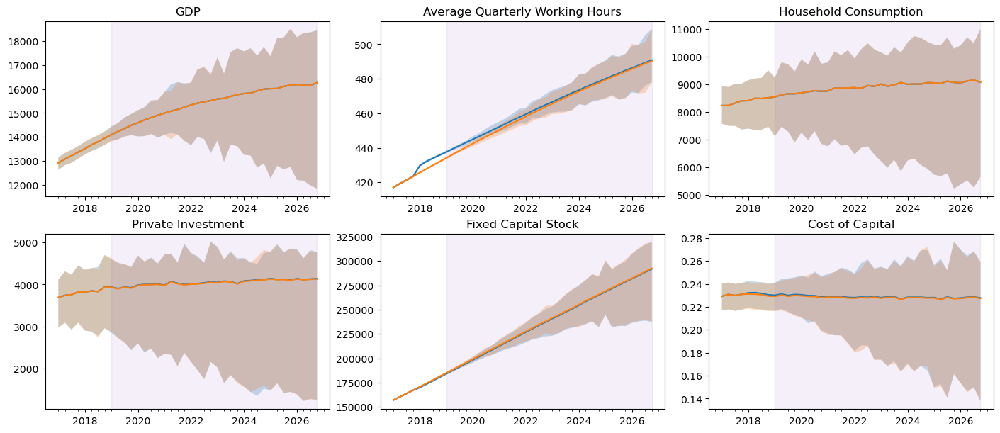

In [86]:
plot_analysis(analysis_data.sel(return_year=100, year='2015').squeeze(),
              shade_after_date=df_final.index[-1],
              kind='level',
              title_rename_dict={'Y': 'GDP',
                                 'N': 'Average Quarterly Working Hours',
                                 'C': 'Household Consumption',
                                 'I': 'Private Investment',
                                 'K': 'Fixed Capital Stock',
                                 'r': 'Cost of Capital'},
              hdi_prob=0.5,
              summary_stat='median')

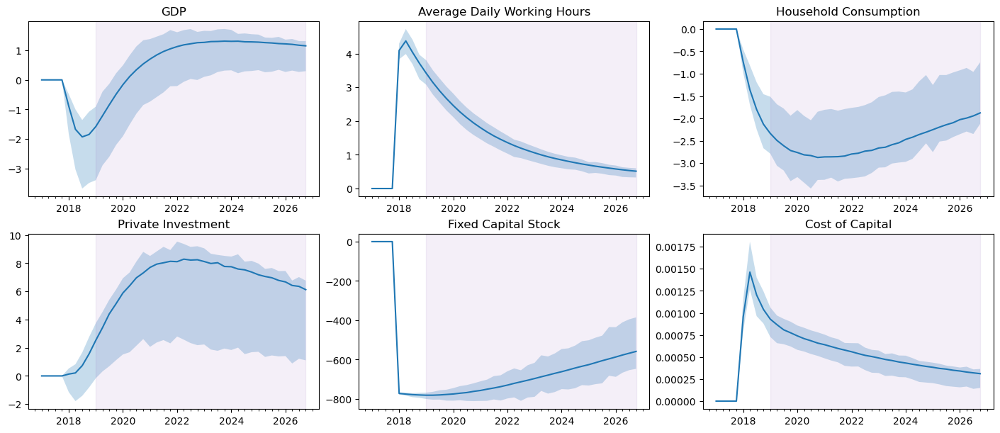

In [87]:
plot_analysis(analysis_data.sel(return_year=100, year='2015').squeeze(),
              shade_after_date=df_final.index[-1],
              kind='delta',
              title_rename_dict={'Y': 'GDP',
                                 'N': 'Average Daily Working Hours',
                                 'C': 'Household Consumption',
                                 'I': 'Private Investment',
                                 'K': 'Fixed Capital Stock',
                                 'r': 'Cost of Capital'},
              hdi_prob=0.5,
              summary_stat='median')

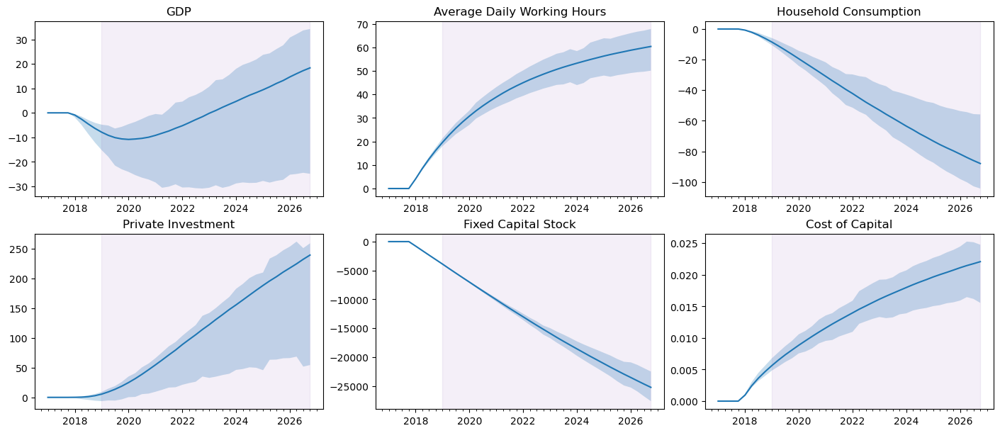

In [88]:
plot_analysis(analysis_data.sel(return_year=100, year='2015').squeeze(),
              shade_after_date=df_final.index[-1],
              kind='cum_delta',
              title_rename_dict={'Y': 'GDP',
                                 'N': 'Average Daily Working Hours',
                                 'C': 'Household Consumption',
                                 'I': 'Private Investment',
                                 'K': 'Fixed Capital Stock',
                                 'r': 'Cost of Capital'},
              hdi_prob=0.5,
              summary_stat='median')

### 2055

In [89]:
table_100RY_2055 = table_100RY.xs(level=1, key='2055').loc[:, ['Y', 'K', 'C']]
col_tuples = [(var_name_to_long.get(x[0]), 
               horizon_to_long_name.get(x[1]),
               horizon_to_quarters.get(x[1])) 
              for x in table_100RY_2055.columns.values]
table_100RY_2055.columns = pd.MultiIndex.from_tuples(col_tuples, names=[None, None, 'Quarters'])
table_100RY_2055.index = [idx_to_long.get(x[0]) for x in table_100RY_2055.index]

print(dataframe_to_typst(table_100RY_2055))

tablex(
  columns: (0.8fr, ) + (1fr, 1fr, 1fr, 1fr, 1fr, 1fr, 1fr, 1fr, 1fr),
  rows: (auto, auto, auto, 2pt,) + (auto,) * 2,
  align: left + horizon,
  auto-lines: false,
  inset: 5pt,
  stroke: .5pt + gray,

        map-rows: (row, cells) => cells.map(c =>
            if c == none { 
                c  // keeping 'none' is important
            } else {
                (..c, fill: if row == 0 { OECD_blue } else if
                  row > 0 and row < 3 { white } else if 
                    calc.rem(row, 2) == 0 { OECD_blue } 
                        else { white })
                    }
        ),
        map-cells: cell => {
            (..cell, content: text(stretch: 75%, cell.content))
        },
        
  hlinex(stroke: black + 3pt),
  [],colspanx(3)[#align(center, [#text(8pt)[GDP (Billion LAK)]])],colspanx(3)[#align(center, [#text(8pt)[Capital Stock (Billion LAK)]])],colspanx(3)[#align(center, [#text(8pt)[Household Consumption (Billion LAK)]])],
  hlinex(stroke: black + 1.0pt),

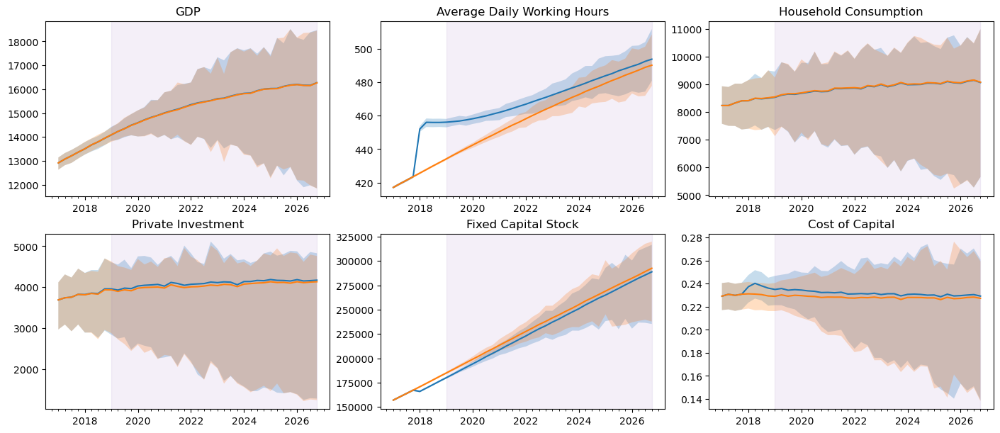

In [90]:
plot_analysis(analysis_data.sel(return_year=100, year='2055').squeeze(),
              shade_after_date=df_final.index[-1],
              kind='level',
              title_rename_dict={'Y': 'GDP',
                                 'N': 'Average Daily Working Hours',
                                 'C': 'Household Consumption',
                                 'I': 'Private Investment',
                                 'K': 'Fixed Capital Stock',
                                 'r': 'Cost of Capital'},
              hdi_prob=0.5,
              summary_stat='median')

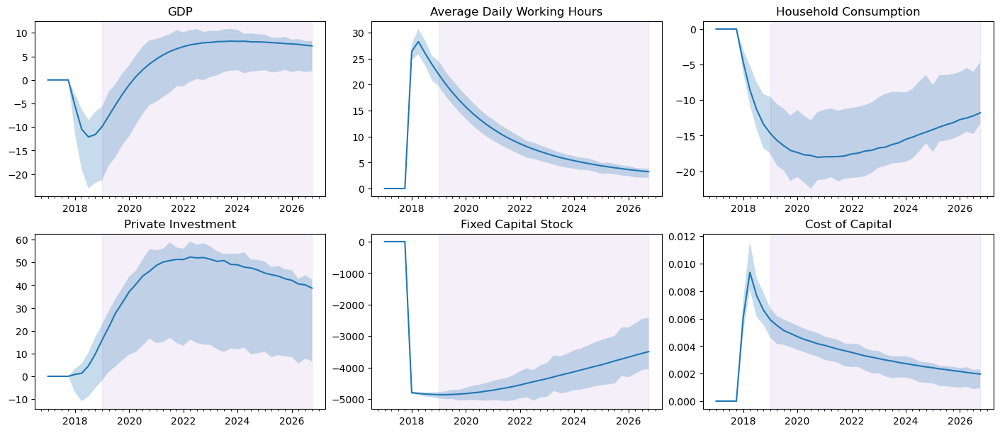

In [91]:
plot_analysis(analysis_data.sel(return_year=100, year='2055').squeeze(),
              shade_after_date=df_final.index[-1],
              kind='delta',
              title_rename_dict={'Y': 'GDP',
                                 'N': 'Average Daily Working Hours',
                                 'C': 'Household Consumption',
                                 'I': 'Private Investment',
                                 'K': 'Fixed Capital Stock',
                                 'r': 'Cost of Capital'},
              hdi_prob=0.5,
              summary_stat='median')

## Summary Table

In [92]:
summary_table_q50 = (analysis_data.delta
     .isel(time=slice(4, 8))
     .sum(dim='time')
     .quantile(0.5, dim=['chain', 'draw'])
     .sel(observed_state='Y')
     .to_dataframe()
     .loc[:, 'delta']
     .unstack('return_year'))

summary_table_q50

return_year,100,50,40,30,25,20,10,4,2,1
year,,,,,,,,,,
2015-01-01,-6.330008,-3.683145,-2.581983,-1.868718,-1.520007,-1.173796,-0.407119,-0.070078,-0.002503,0.000000
2025-01-01,-17.860999,-8.565513,-6.656164,-4.925261,-3.910048,-2.947371,-1.220514,-0.231925,-0.020022,0.000000
2035-01-01,-25.588861,-15.293128,-11.293864,-8.159292,-6.646988,-5.243084,-1.958815,-0.414628,-0.054227,0.000000
2045-01-01,-33.609031,-18.448114,-14.834417,-10.722516,-8.752356,-6.771278,-2.772186,-0.564794,-0.088432,-0.005006
2055-01-01,-39.789853,-20.459599,-16.260577,-11.899404,-10.046064,-8.235198,-3.522978,-0.770854,-0.125974,-0.015017


In [93]:
summary_table_q50.to_csv(here('data/median_cumulative_gdp_loss.csv'))

In [94]:
summary_table_q50_C = (analysis_data.delta
     .isel(time=slice(4, 8))
     .sum(dim='time')
     .quantile(0.5, dim=['chain', 'draw'])
     .sel(observed_state='C')
     .to_dataframe()
     .loc[:, 'delta']
     .unstack('return_year'))

summary_table_q50_C

return_year,100,50,40,30,25,20,10,4,2,1
year,,,,,,,,,,
2015-01-01,-6.162528,-3.585750,-2.513722,-1.819321,-1.479831,-1.142773,-0.396361,-0.068226,-0.002437,0.000000
2025-01-01,-17.387290,-8.338779,-6.480042,-4.794985,-3.806648,-2.869444,-1.188256,-0.225796,-0.019493,0.000000
2035-01-01,-24.909099,-14.887741,-10.994739,-7.943329,-6.471110,-5.104393,-1.907036,-0.403671,-0.052794,0.000000
2045-01-01,-32.714724,-17.958774,-14.441227,-10.438557,-8.520668,-6.592105,-2.698893,-0.549868,-0.086095,-0.004873
2055-01-01,-38.729719,-19.916675,-15.829459,-11.584200,-9.780057,-8.017223,-3.429821,-0.750483,-0.122645,-0.014620


In [95]:
summary_table_q50.to_csv(here('data/median_cumulative_consumption_loss.csv'))